# Separación Whittaker-only enfocada: candidatos congelados

Este notebook **no abre grillas nuevas** y **no usa polinomios**.

Usa únicamente candidatos Whittaker previamente acotados para:
- amplitud: candidatos ASLS enfocados;
- fase: candidatos arPLS `diff_order=2` sin la panza de `diff_order=3`.

Flujo:
1. cargar datos reales;
2. calcular backgrounds Whittaker candidatos;
3. ajustar F3 a la perturbación separada (`data - background`);
4. comparar backgrounds, perturbaciones y residuales;
5. selección manual;
6. exportación opcional a HDF5, apagada por defecto.


In [1]:
# ============================================================
# IMPORTS + CONFIG
# ============================================================
%matplotlib inline

from pathlib import Path
import inspect
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from scipy.optimize import least_squares
from astropy.io import fits
from pybaselines import Baseline
import h5py

# ------------------------------------------------------------
# Input data
# ------------------------------------------------------------
FITS_PATH = Path("Datos_VLF-2008-03/Punta-Lobos/PLO-20080325.fits")

DATE = "2008-03-25"
T_START = pd.Timestamp("2008-03-25 16:00:00")
T_END   = pd.Timestamp("2008-03-25 22:00:00")

ROI_START = pd.Timestamp("2008-03-25 18:00:00")
ROI_END   = pd.Timestamp("2008-03-25 22:00:00")

MASK_START_DEFAULT = pd.Timestamp("2008-03-25 18:35:00")
MASK_END_DEFAULT   = pd.Timestamp("2008-03-25 20:30:00")

RESAMPLE_RULE = "1min"
RESAMPLE_AGG = "median"

# FITS columns used in previous notebooks
COL_TIME_SEC = 0
COL_NAA_V_PHASE = 2
COL_NAA_V_AMP = 3

# ------------------------------------------------------------
# Output
# ------------------------------------------------------------
OUTDIR = Path("whittaker_only_locked_outputs")
OUTDIR.mkdir(parents=True, exist_ok=True)

EXPORT_SELECTED = False
OUTPUT_H5 = OUTDIR / "real_background_perturbation_whittaker_locked_selected_solution.h5"

# ------------------------------------------------------------
# Locked candidate lists: no broad sweep here
# ------------------------------------------------------------
A_CANDIDATE_CONFIGS = [
    # Amplitude candidates kept from the focused Whittaker inspection.
    dict(channel="A", method="asls", lam=1e3, diff_order=2, p=1e-3,
         mask_start=MASK_START_DEFAULT, mask_end=MASK_END_DEFAULT, flare_weight=0.03),
    dict(channel="A", method="asls", lam=3e3, diff_order=2, p=3e-4,
         mask_start=MASK_START_DEFAULT, mask_end=pd.Timestamp("2008-03-25 21:00:00"), flare_weight=0.03),
]

PHI_CANDIDATE_CONFIGS = [
    # Phase candidates: diff_order=2 only. diff_order=3 is excluded because it created a bulge.
    dict(channel="phi", method="arpls", lam=3e4, diff_order=2, p=None,
         mask_start=MASK_START_DEFAULT, mask_end=MASK_END_DEFAULT, flare_weight=0.02),
    dict(channel="phi", method="arpls", lam=1e5, diff_order=2, p=None,
         mask_start=MASK_START_DEFAULT, mask_end=MASK_END_DEFAULT, flare_weight=0.02),
    dict(channel="phi", method="arpls", lam=3e5, diff_order=2, p=None,
         mask_start=MASK_START_DEFAULT, mask_end=MASK_END_DEFAULT, flare_weight=0.02),
]

# Manual initial selection. Change only after inspecting the plots.
SELECT_ID_A = "A_asls_lam1e+03_p1e-03_d2_mask1835_2030_w0.03"
SELECT_ID_PHI = "phi_arpls_lam3e+04_d2_mask1835_2030_w0.02"

PLOT_STYLE = dict(
    fs_tick=13,
    fs_label=15,
    fs_title=16,
    fs_legend=9,
    alpha_grid=0.30,
    lw_data=2.4,
    lw_model=2.3,
    lw_bg=2.4,
    lw_resid=2.0,
)

date_fmt = mdates.DateFormatter("%H:%M")

print("Output directory:", OUTDIR.resolve())
print("EXPORT_SELECTED:", EXPORT_SELECTED)
print("A configs:", len(A_CANDIDATE_CONFIGS))
print("phi configs:", len(PHI_CANDIDATE_CONFIGS))


Output directory: /home/jp/basefolder_JP/whittaker_only_locked_outputs
EXPORT_SELECTED: False
A configs: 2
phi configs: 3


In [2]:
# ============================================================
# LOAD FITS + WINDOW
# ============================================================

def load_first_fits_array(path):
    path = Path(path)
    if not path.is_file():
        raise FileNotFoundError(
            f"No se encontró el archivo FITS:\n{path}\n"
            "Ajusta FITS_PATH en la celda de configuración."
        )

    with fits.open(path) as hdul:
        arrays = [np.asarray(hdu.data) for hdu in hdul if hdu.data is not None]
        header = hdul[0].header.copy()

    if not arrays:
        raise ValueError(f"No encontré datos en el FITS: {path}")

    data = arrays[0]

    if data.ndim == 1:
        data = np.vstack(data)

    return np.asarray(data), header


raw_data, header = load_first_fits_array(FITS_PATH)

time_sec = np.asarray(raw_data[:, COL_TIME_SEC], dtype=float)
phi_full = np.asarray(raw_data[:, COL_NAA_V_PHASE], dtype=float)
A_full = np.asarray(raw_data[:, COL_NAA_V_AMP], dtype=float)

time_full = pd.to_datetime(DATE) + pd.to_timedelta(time_sec, unit="s")

df_full = pd.DataFrame(
    {
        "A_real": A_full,
        "phi_real": phi_full,
    },
    index=pd.DatetimeIndex(time_full, name="time_utc"),
)

df_full = df_full.replace([np.inf, -np.inf], np.nan).dropna()
df_full = df_full[~df_full.index.duplicated(keep="first")].sort_index()

df_window = df_full.loc[(df_full.index >= T_START) & (df_full.index <= T_END)].copy()

if RESAMPLE_RULE is not None:
    if RESAMPLE_AGG == "median":
        df_window = df_window.resample(RESAMPLE_RULE).median()
    elif RESAMPLE_AGG == "mean":
        df_window = df_window.resample(RESAMPLE_RULE).mean()
    else:
        raise ValueError("RESAMPLE_AGG debe ser 'median' o 'mean'.")
    df_window = df_window.interpolate("time").dropna()

if df_window.empty:
    raise ValueError("La ventana 16:00–22:00 quedó vacía.")

time_utc = pd.DatetimeIndex(df_window.index)
t_hours = np.array((time_utc - time_utc[0]).total_seconds() / 3600.0, dtype=float)

A_real = df_window["A_real"].to_numpy(dtype=float)
phi_real = df_window["phi_real"].to_numpy(dtype=float)

roi_mask = (time_utc >= ROI_START) & (time_utc <= ROI_END)
default_mask = (time_utc >= MASK_START_DEFAULT) & (time_utc <= MASK_END_DEFAULT)

print("FITS loaded:", FITS_PATH)
print("Window:", time_utc[0], "->", time_utc[-1])
print("Samples:", len(time_utc), "| ROI samples:", int(roi_mask.sum()))
display(df_window.head())
display(df_window.tail())


FITS loaded: Datos_VLF-2008-03/Punta-Lobos/PLO-20080325.fits
Window: 2008-03-25 16:00:00 -> 2008-03-25 22:00:00
Samples: 361 | ROI samples: 241


,A_real,phi_real
time_utc,,
2008-03-25 16:00:00,38.340000,558.390015
2008-03-25 16:01:00,38.295000,558.479980
2008-03-25 16:02:00,38.290001,558.464996
2008-03-25 16:03:00,38.330002,558.285004
2008-03-25 16:04:00,38.320000,558.059998


,A_real,phi_real
time_utc,,
2008-03-25 21:56:00,32.254999,522.414978
2008-03-25 21:57:00,32.200001,522.424988
2008-03-25 21:58:00,32.094999,522.825012
2008-03-25 21:59:00,32.045000,522.195007
2008-03-25 22:00:00,32.029999,521.609985


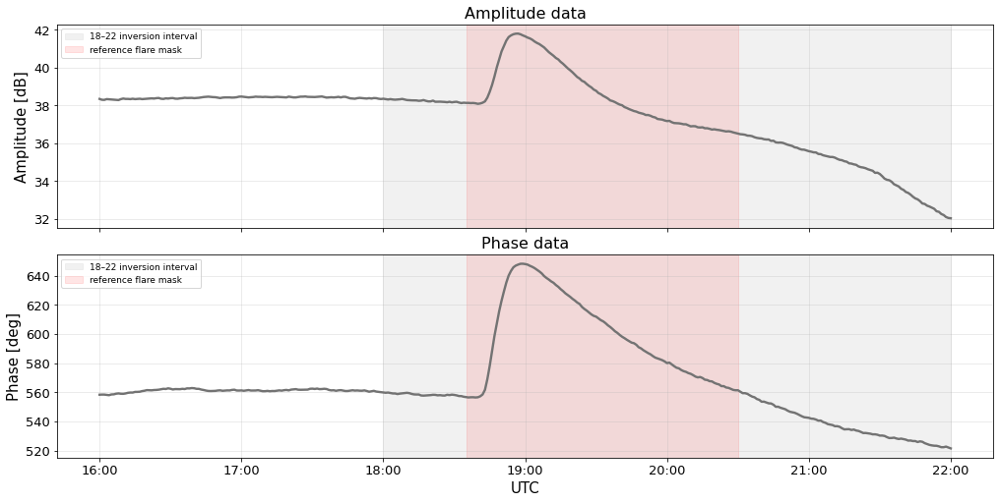

In [3]:
# ============================================================
# QUICK DATA PLOT
# ============================================================
fig, ax = plt.subplots(2, 1, figsize=(14, 7), sharex=True, constrained_layout=True, facecolor="white")

ax[0].plot(time_utc, A_real, lw=PLOT_STYLE["lw_data"], color="0.45")
ax[0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[0].axvspan(MASK_START_DEFAULT, MASK_END_DEFAULT, color="red", alpha=0.10, label="reference flare mask")
ax[0].set_title("Amplitude data", fontsize=PLOT_STYLE["fs_title"])
ax[0].set_ylabel("Amplitude [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

ax[1].plot(time_utc, phi_real, lw=PLOT_STYLE["lw_data"], color="0.45")
ax[1].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[1].axvspan(MASK_START_DEFAULT, MASK_END_DEFAULT, color="red", alpha=0.10, label="reference flare mask")
ax[1].set_title("Phase data", fontsize=PLOT_STYLE["fs_title"])
ax[1].set_ylabel("Phase [deg]", fontsize=PLOT_STYLE["fs_label"])
ax[1].set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])
ax[1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

for a in ax:
    a.xaxis.set_major_formatter(date_fmt)
    a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

fig.savefig(OUTDIR / "000_input_data.png", dpi=200, bbox_inches="tight")
plt.show()


In [4]:
# ============================================================
# HELPERS: F3, Whittaker call, metrics
# ============================================================

def sigmoid(z):
    z = np.clip(z, -80, 80)
    return 1.0 / (1.0 + np.exp(-z))


def f3_unit(t, t_pk, tau_u, tau_d, eps):
    tau_u = max(float(tau_u), 1e-8)
    tau_d = max(float(tau_d), 1e-8)
    eps = max(float(eps), 1e-8)

    w = tau_u + (tau_d - tau_u) * sigmoid((t - t_pk) / eps)
    y = np.exp(-0.5 * ((t - t_pk) / w) ** 2)

    ymax = np.nanmax(y)
    if ymax > 0:
        y = y / ymax

    return y


def fit_f3_to_perturbation(y, allow_negative=False):
    y = np.asarray(y, dtype=float)

    if allow_negative:
        idx_pk = int(np.nanargmax(np.abs(y)))
        amp0 = float(y[idx_pk])
        amp_lower = -2.0 * max(np.nanmax(np.abs(y)), 1.0)
        amp_upper =  2.0 * max(np.nanmax(np.abs(y)), 1.0)
    else:
        idx_pk = int(np.nanargmax(y))
        amp0 = max(float(y[idx_pk]), 1e-3)
        amp_lower = 0.0
        amp_upper = max(2.0 * np.nanmax(y), 1.0)

    tpk0 = float(t_hours[idx_pk])

    p0 = np.array([
        amp0,
        tpk0,
        0.08,
        0.70,
        0.05,
    ])

    lower = np.array([
        amp_lower,
        max(np.nanmin(t_hours), tpk0 - 0.7),
        0.005,
        0.03,
        0.005,
    ])

    upper = np.array([
        amp_upper,
        min(np.nanmax(t_hours), tpk0 + 0.7),
        0.70,
        3.00,
        0.70,
    ])

    def residual_fun(p):
        amp, t_pk, tau_u, tau_d, eps = p
        return amp * f3_unit(t_hours, t_pk, tau_u, tau_d, eps) - y

    res = least_squares(
        residual_fun,
        p0,
        bounds=(lower, upper),
        max_nfev=50000,
        xtol=1e-10,
        ftol=1e-10,
        gtol=1e-10,
    )

    amp, t_pk, tau_u, tau_d, eps = res.x
    y_fit = amp * f3_unit(t_hours, t_pk, tau_u, tau_d, eps)

    return y_fit, {
        "amp": float(amp),
        "t_pk": float(t_pk),
        "tau_u": float(tau_u),
        "tau_d": float(tau_d),
        "eps": float(eps),
        "cost": float(res.cost),
        "success": bool(res.success),
    }


def call_baseline_method(method_func, y, kwargs):
    accepted = set(inspect.signature(method_func).parameters.keys())
    clean_kwargs = {k: v for k, v in kwargs.items() if k in accepted}
    baseline, params = method_func(y, **clean_kwargs)
    return baseline, params, ("weights" in accepted)


def make_weights(mask_start, mask_end, flare_weight):
    weights = np.ones(len(time_utc), dtype=float)
    mask = (time_utc >= mask_start) & (time_utc <= mask_end)
    weights[mask] = flare_weight
    return weights, mask


def curvature_rms(y):
    y = np.asarray(y, dtype=float)
    if len(y) < 3:
        return np.nan
    return float(np.sqrt(np.mean(np.diff(y, n=2) ** 2)))


def background_bulge_abs(bg, mask_start, mask_end):
    bg = np.asarray(bg, dtype=float)
    mask = (time_utc >= mask_start) & (time_utc <= mask_end)

    if mask.sum() < 3:
        return np.nan

    idx = np.where(mask)[0]
    i0, i1 = idx[0], idx[-1]

    line = np.interp(
        np.arange(i0, i1 + 1),
        [i0, i1],
        [bg[i0], bg[i1]],
    )

    diff = bg[i0:i1 + 1] - line
    return float(np.nanmax(np.abs(diff)))


def candidate_id(channel, cfg):
    p_txt = "" if cfg["p"] is None else f"_p{cfg['p']:.0e}"
    return (
        f"{channel}_{cfg['method']}_lam{cfg['lam']:.0e}"
        f"{p_txt}_d{cfg['diff_order']}"
        f"_mask{cfg['mask_start'].strftime('%H%M')}_{cfg['mask_end'].strftime('%H%M')}"
        f"_w{cfg['flare_weight']}"
    )


def run_one_whittaker_candidate(y_data, channel, cfg):
    y_data = np.asarray(y_data, dtype=float)

    baseline_fitter = Baseline(x_data=t_hours)
    if not hasattr(baseline_fitter, cfg["method"]):
        raise ValueError(f"pybaselines no tiene método: {cfg['method']}")

    method_func = getattr(baseline_fitter, cfg["method"])

    weights, mask = make_weights(cfg["mask_start"], cfg["mask_end"], cfg["flare_weight"])

    kwargs = dict(
        lam=cfg["lam"],
        p=cfg["p"],
        diff_order=cfg["diff_order"],
        max_iter=100,
        tol=1e-4,
        weights=weights,
    )

    bg, params, weights_used = call_baseline_method(method_func, y_data, kwargs)

    perturbation_raw = y_data - bg

    fitted_f3, f3_params = fit_f3_to_perturbation(perturbation_raw, allow_negative=False)

    total_fit = bg + fitted_f3
    residual = y_data - total_fit

    pre_mask = time_utc < cfg["mask_start"]
    post_mask = time_utc > cfg["mask_end"]

    cid = candidate_id(channel, cfg)

    return {
        "id": cid,
        "channel": channel,
        "method": cfg["method"],
        "lam": cfg["lam"],
        "p": cfg["p"],
        "diff_order": cfg["diff_order"],
        "mask_start": cfg["mask_start"],
        "mask_end": cfg["mask_end"],
        "flare_weight": cfg["flare_weight"],
        "weights_used": bool(weights_used),
        "background": np.asarray(bg, dtype=float),
        "perturbation_raw": np.asarray(perturbation_raw, dtype=float),
        "perturbation": np.asarray(fitted_f3, dtype=float),
        "total_fit": np.asarray(total_fit, dtype=float),
        "residual": np.asarray(residual, dtype=float),
        "baseline_params": params,
        "f3_params": f3_params,
        "bg_roughness": curvature_rms(bg),
        "bg_bulge_abs": background_bulge_abs(bg, cfg["mask_start"], cfg["mask_end"]),
        "rms_residual_all": float(np.sqrt(np.nanmean(residual ** 2))),
        "rms_residual_roi": float(np.sqrt(np.nanmean(residual[roi_mask] ** 2))),
        "max_abs_residual_roi": float(np.nanmax(np.abs(residual[roi_mask]))),
        "pre_flare_pert_rms": float(np.sqrt(np.nanmean(perturbation_raw[pre_mask] ** 2))) if np.any(pre_mask) else np.nan,
        "post_mask_pert_rms": float(np.sqrt(np.nanmean(perturbation_raw[post_mask] ** 2))) if np.any(post_mask) else np.nan,
        "pert_max_raw": float(np.nanmax(perturbation_raw)),
        "pert_min_raw": float(np.nanmin(perturbation_raw)),
        "pert_peak_time_raw": time_utc[int(np.nanargmax(perturbation_raw))],
    }


def candidates_to_df(candidates):
    return pd.DataFrame([
        {
            "id": c["id"],
            "channel": c["channel"],
            "method": c["method"],
            "lam": c["lam"],
            "p": c["p"],
            "diff_order": c["diff_order"],
            "mask_start": c["mask_start"].strftime("%H:%M"),
            "mask_end": c["mask_end"].strftime("%H:%M"),
            "flare_weight": c["flare_weight"],
            "weights_used": c["weights_used"],
            "bg_bulge_abs": c["bg_bulge_abs"],
            "bg_roughness": c["bg_roughness"],
            "rms_residual_roi": c["rms_residual_roi"],
            "max_abs_residual_roi": c["max_abs_residual_roi"],
            "pre_flare_pert_rms": c["pre_flare_pert_rms"],
            "post_mask_pert_rms": c["post_mask_pert_rms"],
            "pert_max_raw": c["pert_max_raw"],
            "pert_min_raw": c["pert_min_raw"],
            "pert_peak_time_raw": c["pert_peak_time_raw"].strftime("%H:%M"),
            "F3_amp": c["f3_params"]["amp"],
            "F3_t_pk": c["f3_params"]["t_pk"],
            "F3_tau_u": c["f3_params"]["tau_u"],
            "F3_tau_d": c["f3_params"]["tau_d"],
            "F3_eps": c["f3_params"]["eps"],
        }
        for c in candidates
    ])


In [5]:
# ============================================================
# RUN ONLY THE LOCKED CANDIDATES
# ============================================================
A_candidates = []
phi_candidates = []

for cfg in A_CANDIDATE_CONFIGS:
    print("Running A:", cfg)
    A_candidates.append(run_one_whittaker_candidate(A_real, "A", cfg))

for cfg in PHI_CANDIDATE_CONFIGS:
    print("Running phi:", cfg)
    phi_candidates.append(run_one_whittaker_candidate(phi_real, "phi", cfg))

A_summary = candidates_to_df(A_candidates)
phi_summary = candidates_to_df(phi_candidates)

A_summary.to_csv(OUTDIR / "A_locked_whittaker_summary.csv", index=False)
phi_summary.to_csv(OUTDIR / "phi_locked_whittaker_summary.csv", index=False)

print("\nAmplitude candidates:")
display(A_summary)

print("\nPhase candidates:")
display(phi_summary)

print("\nA candidate IDs:")
for c in A_candidates:
    print(" ", c["id"])

print("\nPhase candidate IDs:")
for c in phi_candidates:
    print(" ", c["id"])


Running A: {'channel': 'A', 'method': 'asls', 'lam': 1000.0, 'diff_order': 2, 'p': 0.001, 'mask_start': Timestamp('2008-03-25 18:35:00'), 'mask_end': Timestamp('2008-03-25 20:30:00'), 'flare_weight': 0.03}
Running A: {'channel': 'A', 'method': 'asls', 'lam': 3000.0, 'diff_order': 2, 'p': 0.0003, 'mask_start': Timestamp('2008-03-25 18:35:00'), 'mask_end': Timestamp('2008-03-25 21:00:00'), 'flare_weight': 0.03}
Running phi: {'channel': 'phi', 'method': 'arpls', 'lam': 30000.0, 'diff_order': 2, 'p': None, 'mask_start': Timestamp('2008-03-25 18:35:00'), 'mask_end': Timestamp('2008-03-25 20:30:00'), 'flare_weight': 0.02}
Running phi: {'channel': 'phi', 'method': 'arpls', 'lam': 100000.0, 'diff_order': 2, 'p': None, 'mask_start': Timestamp('2008-03-25 18:35:00'), 'mask_end': Timestamp('2008-03-25 20:30:00'), 'flare_weight': 0.02}
Running phi: {'channel': 'phi', 'method': 'arpls', 'lam': 300000.0, 'diff_order': 2, 'p': None, 'mask_start': Timestamp('2008-03-25 18:35:00'), 'mask_end': Timestam

,id,channel,method,lam,p,diff_order,mask_start,mask_end,flare_weight,weights_used,...,pre_flare_pert_rms,post_mask_pert_rms,pert_max_raw,pert_min_raw,pert_peak_time_raw,F3_amp,F3_t_pk,F3_tau_u,F3_tau_d,F3_eps
0,A_asls_lam1e+03_p1e-03_d2_mask1835_2030_w0.03,A,asls,1000.0,0.0010,2,18:35,20:30,0.03,True,...,0.128178,0.356462,3.527690,-0.046593,18:56,3.512424,2.891659,0.075110,0.344461,0.005
1,A_asls_lam3e+03_p3e-04_d2_mask1835_2100_w0.03,A,asls,3000.0,0.0003,2,18:35,21:00,0.03,True,...,0.113768,0.595680,3.756137,-0.026680,18:57,3.724210,2.893867,0.077464,0.382036,0.005



Phase candidates:


,id,channel,method,lam,p,diff_order,mask_start,mask_end,flare_weight,weights_used,...,pre_flare_pert_rms,post_mask_pert_rms,pert_max_raw,pert_min_raw,pert_peak_time_raw,F3_amp,F3_t_pk,F3_tau_u,F3_tau_d,F3_eps
0,phi_arpls_lam3e+04_d2_mask1835_2030_w0.02,phi,arpls,30000.0,None,2,18:35,20:30,0.02,True,...,0.838466,6.266281,93.130878,-0.834618,18:59,85.829079,2.878705,0.075587,0.813878,0.005
1,phi_arpls_lam1e+05_d2_mask1835_2030_w0.02,phi,arpls,100000.0,None,2,18:35,20:30,0.02,True,...,0.845265,6.898648,93.190536,-0.959537,18:59,85.534404,2.877367,0.074709,0.833185,0.005
2,phi_arpls_lam3e+05_d2_mask1835_2030_w0.02,phi,arpls,300000.0,None,2,18:35,20:30,0.02,True,...,0.790922,7.526245,93.293857,-1.415566,18:59,85.298809,2.876263,0.074047,0.851929,0.005



A candidate IDs:
  A_asls_lam1e+03_p1e-03_d2_mask1835_2030_w0.03
  A_asls_lam3e+03_p3e-04_d2_mask1835_2100_w0.03

Phase candidate IDs:
  phi_arpls_lam3e+04_d2_mask1835_2030_w0.02
  phi_arpls_lam1e+05_d2_mask1835_2030_w0.02
  phi_arpls_lam3e+05_d2_mask1835_2030_w0.02


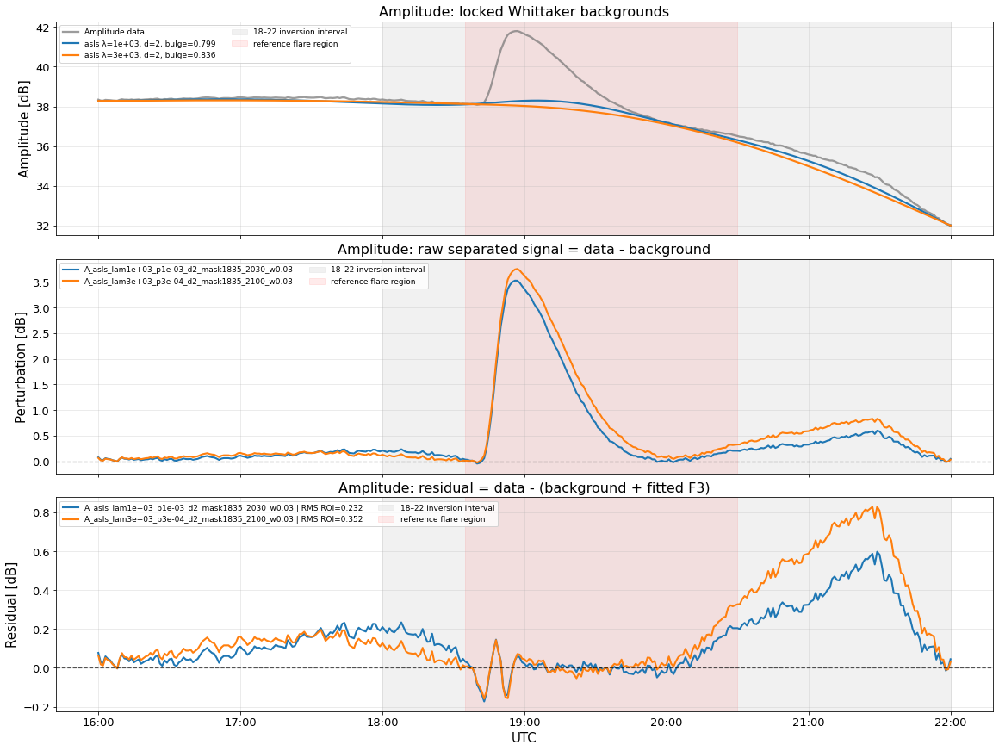

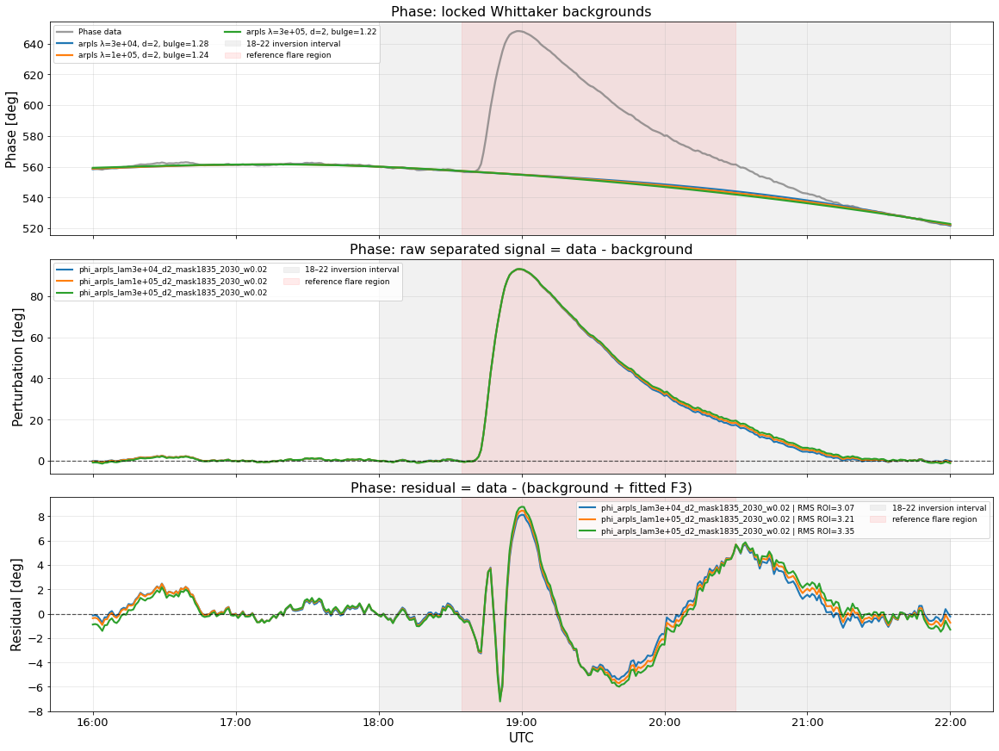

In [6]:
# ============================================================
# PLOT LOCKED CANDIDATES: A and phase
# ============================================================

def plot_locked_candidates(candidates, y_data, channel_label, units, out_prefix):
    fig, ax = plt.subplots(
        3, 1,
        figsize=(16, 12),
        sharex=True,
        constrained_layout=True,
        facecolor="white",
    )

    ax[0].plot(time_utc, y_data, lw=2.3, color="0.45", alpha=0.70, label=f"{channel_label} data")

    for c in candidates:
        ax[0].plot(
            time_utc,
            c["background"],
            lw=2.2,
            label=(
                f"{c['method']} λ={c['lam']:.0e}, d={c['diff_order']}"
                f", bulge={c['bg_bulge_abs']:.3g}"
            ),
        )

    ax[0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[0].axvspan(MASK_START_DEFAULT, MASK_END_DEFAULT, color="red", alpha=0.08, label="reference flare region")
    ax[0].set_title(f"{channel_label}: locked Whittaker backgrounds", fontsize=PLOT_STYLE["fs_title"])
    ax[0].set_ylabel(f"{channel_label} [{units}]", fontsize=PLOT_STYLE["fs_label"])
    ax[0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True, ncol=2)

    for c in candidates:
        ax[1].plot(
            time_utc,
            c["perturbation_raw"],
            lw=2.1,
            label=f"{c['id']}",
        )

    ax[1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
    ax[1].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[1].axvspan(MASK_START_DEFAULT, MASK_END_DEFAULT, color="red", alpha=0.08, label="reference flare region")
    ax[1].set_title(f"{channel_label}: raw separated signal = data - background", fontsize=PLOT_STYLE["fs_title"])
    ax[1].set_ylabel(f"Perturbation [{units}]", fontsize=PLOT_STYLE["fs_label"])
    ax[1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True, ncol=2)

    for c in candidates:
        ax[2].plot(
            time_utc,
            c["residual"],
            lw=2.1,
            label=f"{c['id']} | RMS ROI={c['rms_residual_roi']:.3g}",
        )

    ax[2].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
    ax[2].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[2].axvspan(MASK_START_DEFAULT, MASK_END_DEFAULT, color="red", alpha=0.08, label="reference flare region")
    ax[2].set_title(f"{channel_label}: residual = data - (background + fitted F3)", fontsize=PLOT_STYLE["fs_title"])
    ax[2].set_ylabel(f"Residual [{units}]", fontsize=PLOT_STYLE["fs_label"])
    ax[2].set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])
    ax[2].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[2].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True, ncol=2)

    for a in ax:
        a.xaxis.set_major_formatter(date_fmt)
        a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

    fig.savefig(OUTDIR / f"{out_prefix}_locked_candidates_summary.png", dpi=200, bbox_inches="tight")
    plt.show()


plot_locked_candidates(A_candidates, A_real, "Amplitude", "dB", "A")
plot_locked_candidates(phi_candidates, phi_real, "Phase", "deg", "phi")


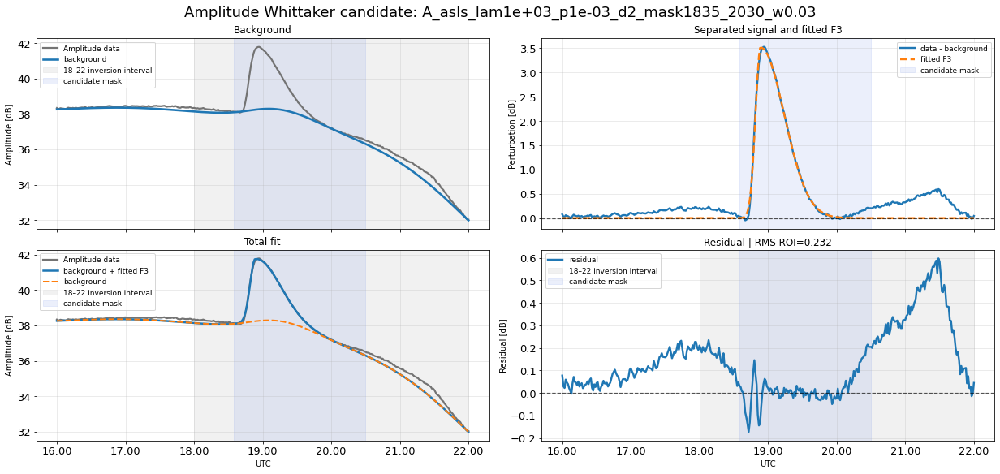

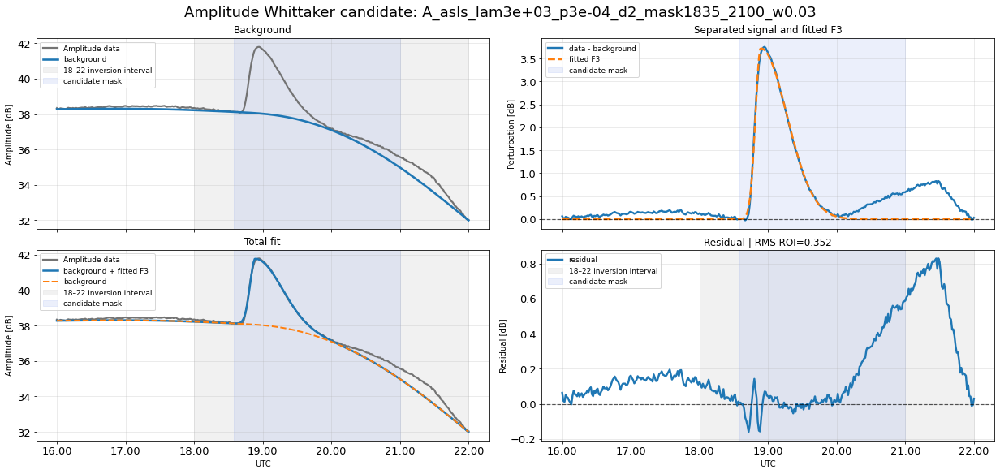

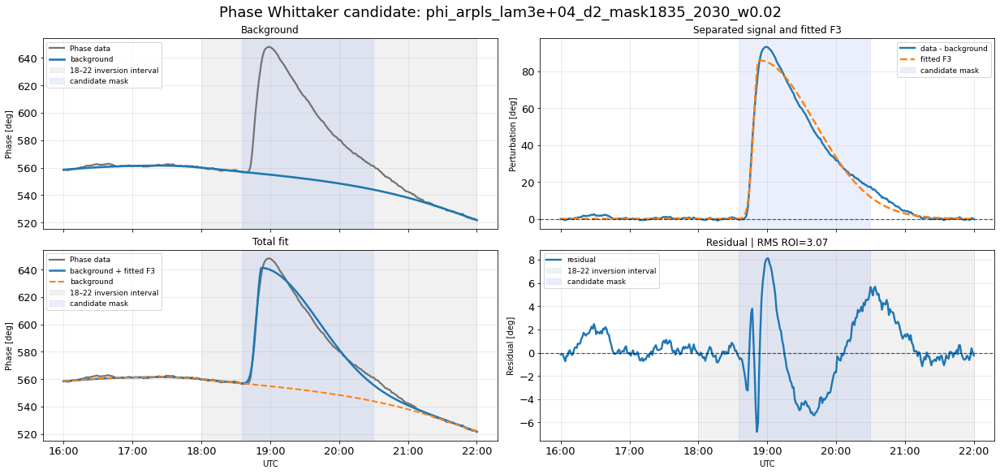

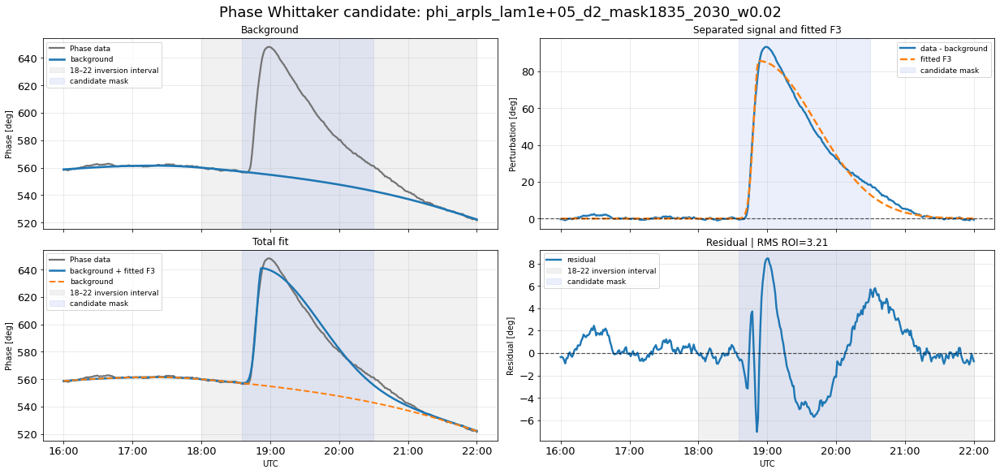

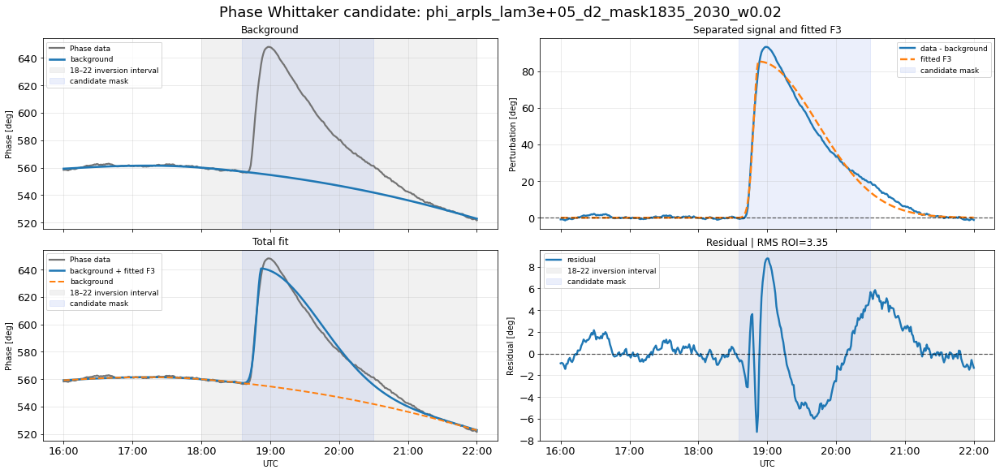

In [7]:
# ============================================================
# INDIVIDUAL CANDIDATE PLOTS
# ============================================================

def plot_individual_candidates(candidates, y_data, channel_label, units, out_prefix):
    for idx, c in enumerate(candidates, start=1):
        fig, ax = plt.subplots(
            2, 2,
            figsize=(17, 8),
            sharex=True,
            constrained_layout=True,
            facecolor="white",
        )

        ax[0, 0].plot(time_utc, y_data, lw=2.2, color="0.45", label=f"{channel_label} data")
        ax[0, 0].plot(time_utc, c["background"], lw=2.6, label="background")
        ax[0, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
        ax[0, 0].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="candidate mask")
        ax[0, 0].set_title("Background")
        ax[0, 0].set_ylabel(f"{channel_label} [{units}]")
        ax[0, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
        ax[0, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

        ax[0, 1].plot(time_utc, c["perturbation_raw"], lw=2.4, label="data - background")
        ax[0, 1].plot(time_utc, c["perturbation"], lw=2.4, ls="--", label="fitted F3")
        ax[0, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
        ax[0, 1].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="candidate mask")
        ax[0, 1].set_title("Separated signal and fitted F3")
        ax[0, 1].set_ylabel(f"Perturbation [{units}]")
        ax[0, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
        ax[0, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

        ax[1, 0].plot(time_utc, y_data, lw=2.2, color="0.45", label=f"{channel_label} data")
        ax[1, 0].plot(time_utc, c["total_fit"], lw=2.5, label="background + fitted F3")
        ax[1, 0].plot(time_utc, c["background"], lw=2.0, ls="--", label="background")
        ax[1, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
        ax[1, 0].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="candidate mask")
        ax[1, 0].set_title("Total fit")
        ax[1, 0].set_ylabel(f"{channel_label} [{units}]")
        ax[1, 0].set_xlabel("UTC")
        ax[1, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
        ax[1, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

        ax[1, 1].plot(time_utc, c["residual"], lw=2.4, label="residual")
        ax[1, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
        ax[1, 1].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
        ax[1, 1].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="candidate mask")
        ax[1, 1].set_title(f"Residual | RMS ROI={c['rms_residual_roi']:.3g}")
        ax[1, 1].set_ylabel(f"Residual [{units}]")
        ax[1, 1].set_xlabel("UTC")
        ax[1, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
        ax[1, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

        for a in ax.flat:
            a.xaxis.set_major_formatter(date_fmt)
            a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

        fig.suptitle(
            f"{channel_label} Whittaker candidate: {c['id']}",
            fontsize=PLOT_STYLE["fs_title"] + 2,
        )

        fig.savefig(OUTDIR / f"{out_prefix}_candidate_{idx:02d}_{c['id']}.png", dpi=200, bbox_inches="tight")
        plt.show()


plot_individual_candidates(A_candidates, A_real, "Amplitude", "dB", "A")
plot_individual_candidates(phi_candidates, phi_real, "Phase", "deg", "phi")


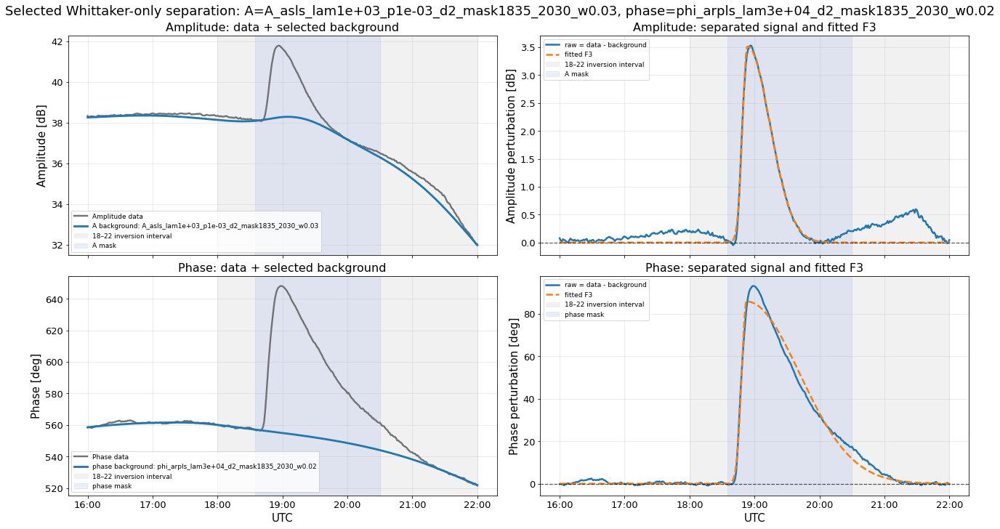

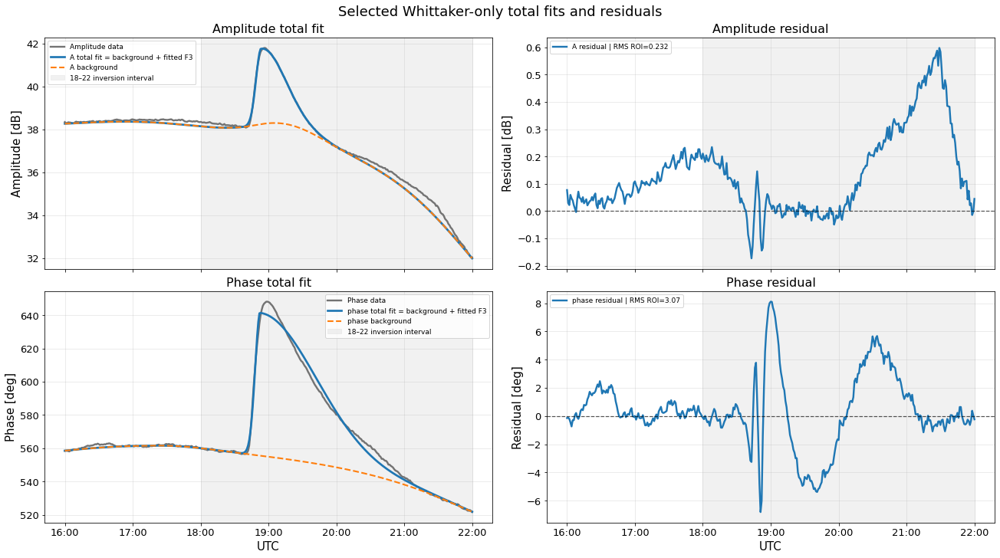

Selected A: A_asls_lam1e+03_p1e-03_d2_mask1835_2030_w0.03
Selected phi: phi_arpls_lam3e+04_d2_mask1835_2030_w0.02
A RMS residual ROI: 0.23169030895006312
phi RMS residual ROI: 3.07140805332529
A bulge abs: 0.7986276103072001
phi bulge abs: 1.2778554774934037
Outputs: /home/jp/basefolder_JP/whittaker_only_locked_outputs


In [8]:
# ============================================================
# MANUAL SELECTION + COMBINED PLOTS
# ============================================================
# Cambia SELECT_ID_A y SELECT_ID_PHI en la primera celda o aquí.

A_sel = next((c for c in A_candidates if c["id"] == SELECT_ID_A), None)
phi_sel = next((c for c in phi_candidates if c["id"] == SELECT_ID_PHI), None)

if A_sel is None:
    raise ValueError(f"No encontré SELECT_ID_A={SELECT_ID_A}\nOpciones: {[c['id'] for c in A_candidates]}")

if phi_sel is None:
    raise ValueError(f"No encontré SELECT_ID_PHI={SELECT_ID_PHI}\nOpciones: {[c['id'] for c in phi_candidates]}")

fig, ax = plt.subplots(2, 2, figsize=(18, 10), sharex=True, constrained_layout=True, facecolor="white")

# Amplitude data + background
ax[0, 0].plot(time_utc, A_real, lw=2.4, color="0.45", label="Amplitude data")
ax[0, 0].plot(time_utc, A_sel["background"], lw=2.8, label=f"A background: {SELECT_ID_A}")
ax[0, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[0, 0].axvspan(A_sel["mask_start"], A_sel["mask_end"], color="royalblue", alpha=0.10, label="A mask")
ax[0, 0].set_title("Amplitude: data + selected background", fontsize=PLOT_STYLE["fs_title"])
ax[0, 0].set_ylabel("Amplitude [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

# Amplitude separated
ax[0, 1].plot(time_utc, A_sel["perturbation_raw"], lw=2.5, label="raw = data - background")
ax[0, 1].plot(time_utc, A_sel["perturbation"], lw=2.5, ls="--", label="fitted F3")
ax[0, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[0, 1].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[0, 1].axvspan(A_sel["mask_start"], A_sel["mask_end"], color="royalblue", alpha=0.10, label="A mask")
ax[0, 1].set_title("Amplitude: separated signal and fitted F3", fontsize=PLOT_STYLE["fs_title"])
ax[0, 1].set_ylabel("Amplitude perturbation [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

# Phase data + background
ax[1, 0].plot(time_utc, phi_real, lw=2.4, color="0.45", label="Phase data")
ax[1, 0].plot(time_utc, phi_sel["background"], lw=2.8, label=f"phase background: {SELECT_ID_PHI}")
ax[1, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[1, 0].axvspan(phi_sel["mask_start"], phi_sel["mask_end"], color="royalblue", alpha=0.10, label="phase mask")
ax[1, 0].set_title("Phase: data + selected background", fontsize=PLOT_STYLE["fs_title"])
ax[1, 0].set_ylabel("Phase [deg]", fontsize=PLOT_STYLE["fs_label"])
ax[1, 0].set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])
ax[1, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

# Phase separated
ax[1, 1].plot(time_utc, phi_sel["perturbation_raw"], lw=2.5, label="raw = data - background")
ax[1, 1].plot(time_utc, phi_sel["perturbation"], lw=2.5, ls="--", label="fitted F3")
ax[1, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[1, 1].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[1, 1].axvspan(phi_sel["mask_start"], phi_sel["mask_end"], color="royalblue", alpha=0.10, label="phase mask")
ax[1, 1].set_title("Phase: separated signal and fitted F3", fontsize=PLOT_STYLE["fs_title"])
ax[1, 1].set_ylabel("Phase perturbation [deg]", fontsize=PLOT_STYLE["fs_label"])
ax[1, 1].set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])
ax[1, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

for a in ax.flat:
    a.xaxis.set_major_formatter(date_fmt)
    a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

fig.suptitle(f"Selected Whittaker-only separation: A={SELECT_ID_A}, phase={SELECT_ID_PHI}", fontsize=PLOT_STYLE["fs_title"] + 2)
fig.savefig(OUTDIR / f"selected_whittaker_separation_A_{SELECT_ID_A}_phi_{SELECT_ID_PHI}.png", dpi=200, bbox_inches="tight")
plt.show()

# Residual view
fig, ax = plt.subplots(2, 2, figsize=(18, 10), sharex=True, constrained_layout=True, facecolor="white")

ax[0, 0].plot(time_utc, A_real, lw=2.4, color="0.45", label="Amplitude data")
ax[0, 0].plot(time_utc, A_sel["total_fit"], lw=2.7, label="A total fit = background + fitted F3")
ax[0, 0].plot(time_utc, A_sel["background"], lw=2.1, ls="--", label="A background")
ax[0, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[0, 0].set_title("Amplitude total fit", fontsize=PLOT_STYLE["fs_title"])
ax[0, 0].set_ylabel("Amplitude [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

ax[0, 1].plot(time_utc, A_sel["residual"], lw=2.4, label=f"A residual | RMS ROI={A_sel['rms_residual_roi']:.3g}")
ax[0, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[0, 1].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35)
ax[0, 1].set_title("Amplitude residual", fontsize=PLOT_STYLE["fs_title"])
ax[0, 1].set_ylabel("Residual [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

ax[1, 0].plot(time_utc, phi_real, lw=2.4, color="0.45", label="Phase data")
ax[1, 0].plot(time_utc, phi_sel["total_fit"], lw=2.7, label="phase total fit = background + fitted F3")
ax[1, 0].plot(time_utc, phi_sel["background"], lw=2.1, ls="--", label="phase background")
ax[1, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[1, 0].set_title("Phase total fit", fontsize=PLOT_STYLE["fs_title"])
ax[1, 0].set_ylabel("Phase [deg]", fontsize=PLOT_STYLE["fs_label"])
ax[1, 0].set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])
ax[1, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

ax[1, 1].plot(time_utc, phi_sel["residual"], lw=2.4, label=f"phase residual | RMS ROI={phi_sel['rms_residual_roi']:.3g}")
ax[1, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[1, 1].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35)
ax[1, 1].set_title("Phase residual", fontsize=PLOT_STYLE["fs_title"])
ax[1, 1].set_ylabel("Residual [deg]", fontsize=PLOT_STYLE["fs_label"])
ax[1, 1].set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])
ax[1, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

for a in ax.flat:
    a.xaxis.set_major_formatter(date_fmt)
    a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

fig.suptitle(f"Selected Whittaker-only total fits and residuals", fontsize=PLOT_STYLE["fs_title"] + 2)
fig.savefig(OUTDIR / f"selected_whittaker_totalfit_residual_A_{SELECT_ID_A}_phi_{SELECT_ID_PHI}.png", dpi=200, bbox_inches="tight")
plt.show()

print("Selected A:", SELECT_ID_A)
print("Selected phi:", SELECT_ID_PHI)
print("A RMS residual ROI:", A_sel["rms_residual_roi"])
print("phi RMS residual ROI:", phi_sel["rms_residual_roi"])
print("A bulge abs:", A_sel["bg_bulge_abs"])
print("phi bulge abs:", phi_sel["bg_bulge_abs"])
print("Outputs:", OUTDIR.resolve())


In [11]:
# ============================================================
# F3 FITTER REQUIRED BY WHITTAKER AMPLITUDE TEST CELL
# Define this once before running the amplitude Whittaker tests
# ============================================================

import numpy as np
import pandas as pd
from scipy.optimize import least_squares

def _sigmoid(z):
    z = np.clip(z, -80, 80)
    return 1.0 / (1.0 + np.exp(-z))

def _f3_unit(t, t_pk, tau_u, tau_d, eps):
    tau_u = max(float(tau_u), 1e-8)
    tau_d = max(float(tau_d), 1e-8)
    eps   = max(float(eps),   1e-8)

    w = tau_u + (tau_d - tau_u) * _sigmoid((t - t_pk) / eps)
    y = np.exp(-0.5 * ((t - t_pk) / w) ** 2)

    ymax = np.nanmax(y)
    if ymax > 0:
        y = y / ymax

    return y

def _fit_f3_to_perturbation(time_array, y):
    time_array = pd.to_datetime(time_array)
    y = np.asarray(y, dtype=float)

    t = np.array(
        (time_array - time_array[0]).total_seconds() / 3600.0,
        dtype=float,
    )

    idx_pk = int(np.nanargmax(y))
    amp0 = max(float(y[idx_pk]), 1e-3)
    tpk0 = float(t[idx_pk])

    p0 = np.array([
        amp0,
        tpk0,
        0.08,  # tau_u [h]
        0.70,  # tau_d [h]
        0.05,  # eps [h]
    ])

    lower = np.array([
        0.0,
        max(np.nanmin(t), tpk0 - 0.7),
        0.005,
        0.03,
        0.005,
    ])

    upper = np.array([
        max(2.0 * np.nanmax(y), 1.0),
        min(np.nanmax(t), tpk0 + 0.7),
        0.70,
        3.00,
        0.70,
    ])

    def residual_fun(p):
        amp, t_pk, tau_u, tau_d, eps = p
        return amp * _f3_unit(t, t_pk, tau_u, tau_d, eps) - y

    res = least_squares(
        residual_fun,
        p0,
        bounds=(lower, upper),
        max_nfev=50000,
        xtol=1e-10,
        ftol=1e-10,
        gtol=1e-10,
    )

    amp, t_pk, tau_u, tau_d, eps = res.x
    y_fit = amp * _f3_unit(t, t_pk, tau_u, tau_d, eps)

    return y_fit, {
        "amp": amp,
        "t_pk": t_pk,
        "tau_u": tau_u,
        "tau_d": tau_d,
        "eps": eps,
        "cost": res.cost,
        "success": res.success,
    }

print("_fit_f3_to_perturbation definido correctamente.")

_fit_f3_to_perturbation definido correctamente.


,status,id,reject_reasons,method,lam,p,diff_order,w,weights_supported,bg_bulge_abs,...,post_mask_pert_rms,pert_max,pert_min,pert_peak_time,F3_amp,F3_t_pk,F3_tau_u,F3_tau_d,F3_eps,score
0,REJECT,A_iasls_lam3e+04_p3e-04_d2_mask1835_2030_w0.01,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,30000.0,0.0003,2,0.01,True,0.000260,...,2.106322,6.570511,-0.000043,2008-03-25 18:57:00,4.553012,3.077156,0.700000,1.612552,0.700000,18.507364
1,REJECT,A_iasls_lam3e+04_p3e-04_d2_mask1835_2030_w0.02,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,30000.0,0.0003,2,0.02,True,0.000260,...,2.106322,6.570511,-0.000043,2008-03-25 18:57:00,4.553012,3.077156,0.700000,1.612552,0.700000,18.507364
2,REJECT,A_iasls_lam1e+04_p3e-04_d2_mask1835_2030_w0.01,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,10000.0,0.0003,2,0.01,True,0.000776,...,2.104577,6.566383,-0.000043,2008-03-25 18:57:00,4.549030,3.077763,0.700000,1.611992,0.700000,18.488339
3,REJECT,A_iasls_lam1e+04_p3e-04_d2_mask1835_2030_w0.02,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,10000.0,0.0003,2,0.02,True,0.000776,...,2.104577,6.566383,-0.000043,2008-03-25 18:57:00,4.549030,3.077763,0.700000,1.611992,0.700000,18.488339
4,REJECT,A_iasls_lam3e+03_p3e-04_d2_mask1835_2030_w0.01,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,3000.0,0.0003,2,0.01,True,0.002580,...,2.098478,6.551957,-0.000043,2008-03-25 18:57:00,4.535101,3.079887,0.700000,1.610029,0.700000,18.421878
5,REJECT,A_iasls_lam3e+03_p3e-04_d2_mask1835_2030_w0.02,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,3000.0,0.0003,2,0.02,True,0.002580,...,2.098478,6.551957,-0.000043,2008-03-25 18:57:00,4.535101,3.079887,0.700000,1.610029,0.700000,18.421878
6,REJECT,A_iasls_lam3e+04_p1e-03_d2_mask1835_2030_w0.01,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,30000.0,0.0010,2,0.01,True,0.002631,...,2.097859,6.550949,-0.000473,2008-03-25 18:57:00,4.534222,3.080094,0.700000,1.609692,0.700000,18.417370
7,REJECT,A_iasls_lam3e+04_p1e-03_d2_mask1835_2030_w0.02,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,30000.0,0.0010,2,0.02,True,0.002631,...,2.097859,6.550949,-0.000473,2008-03-25 18:57:00,4.534222,3.080094,0.700000,1.609692,0.700000,18.417370
8,REJECT,A_iasls_lam1e+04_p1e-03_d2_mask1835_2030_w0.01,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,10000.0,0.0010,2,0.01,True,0.007808,...,2.080239,6.509161,-0.000469,2008-03-25 18:57:00,4.493719,3.086292,0.700000,1.604018,0.700000,18.224096
9,REJECT,A_iasls_lam1e+04_p1e-03_d2_mask1835_2030_w0.02,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,10000.0,0.0010,2,0.02,True,0.007808,...,2.080239,6.509161,-0.000469,2008-03-25 18:57:00,4.493719,3.086292,0.700000,1.604018,0.700000,18.224096


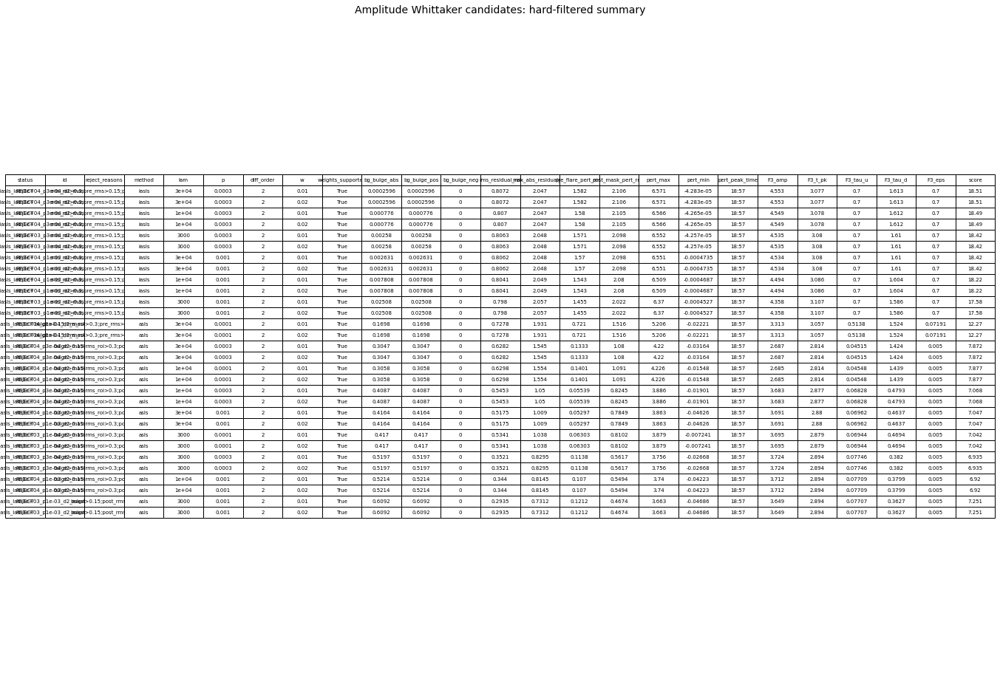

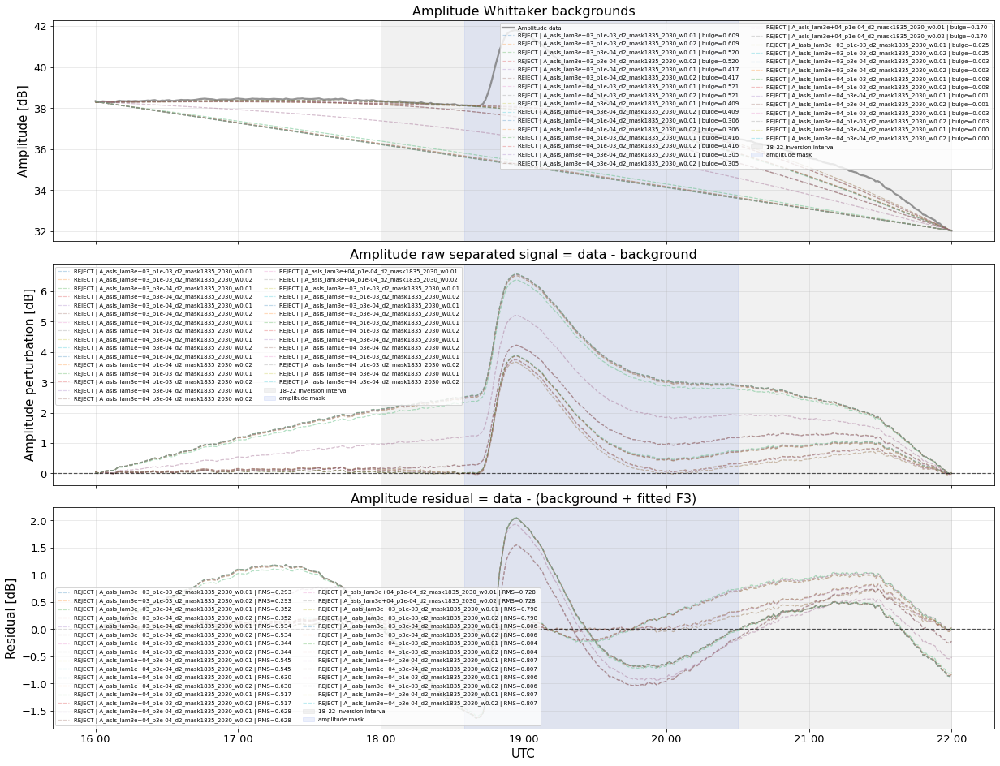

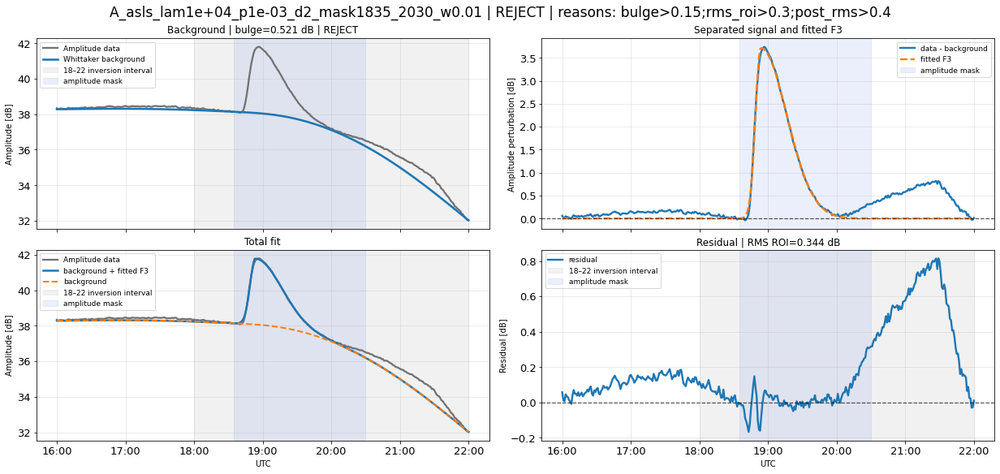

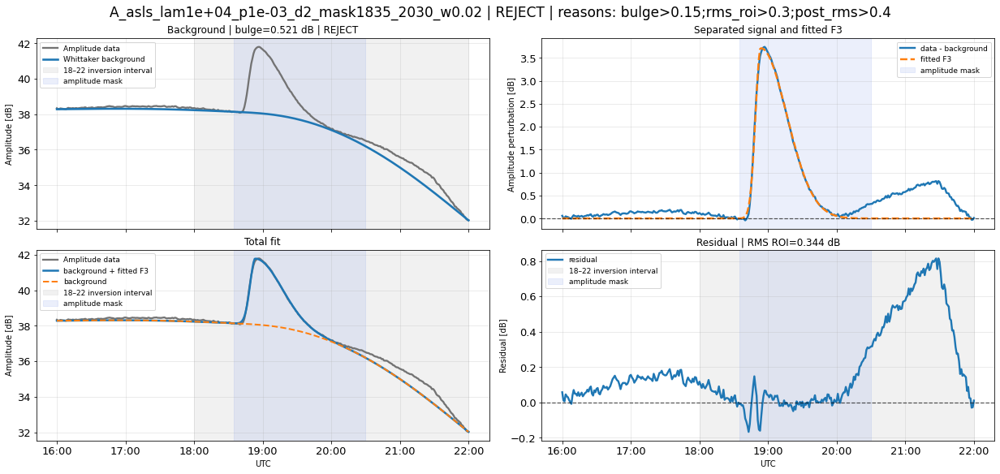

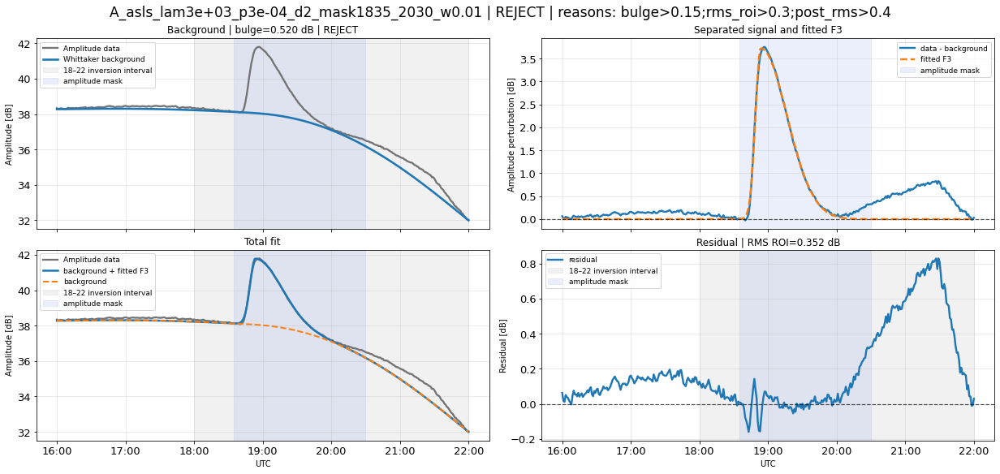

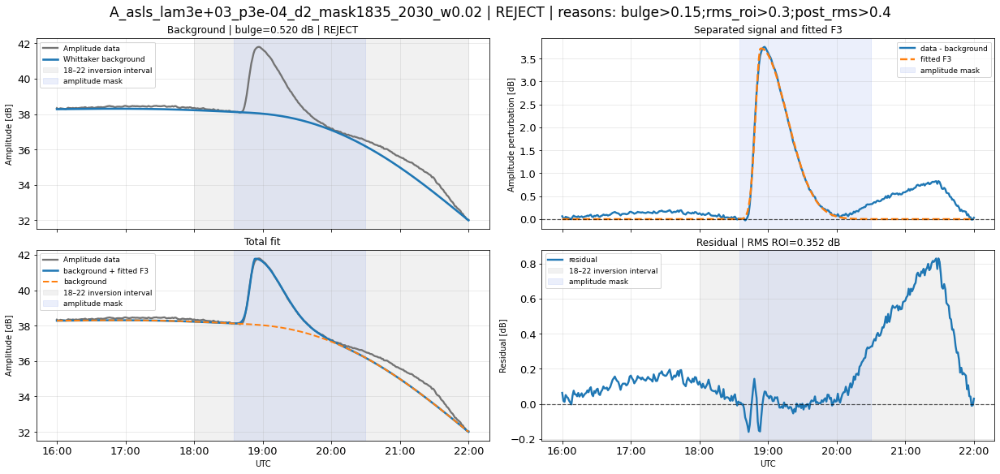

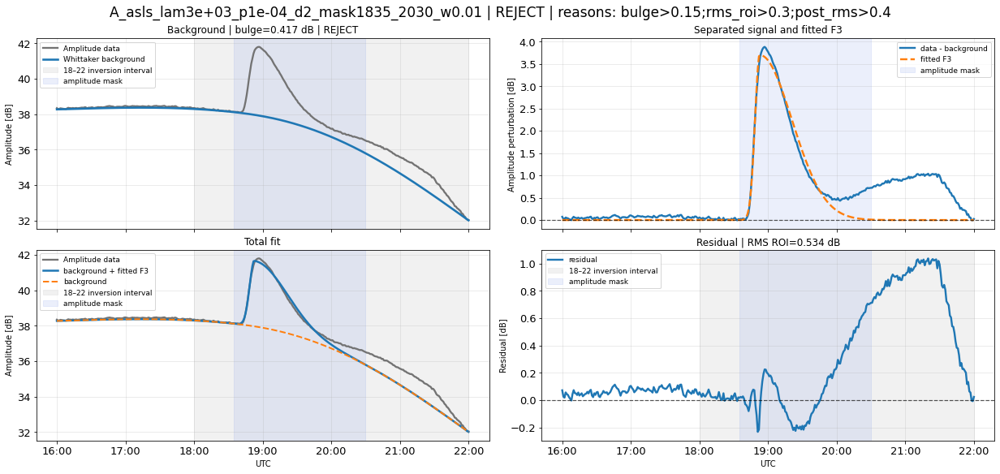

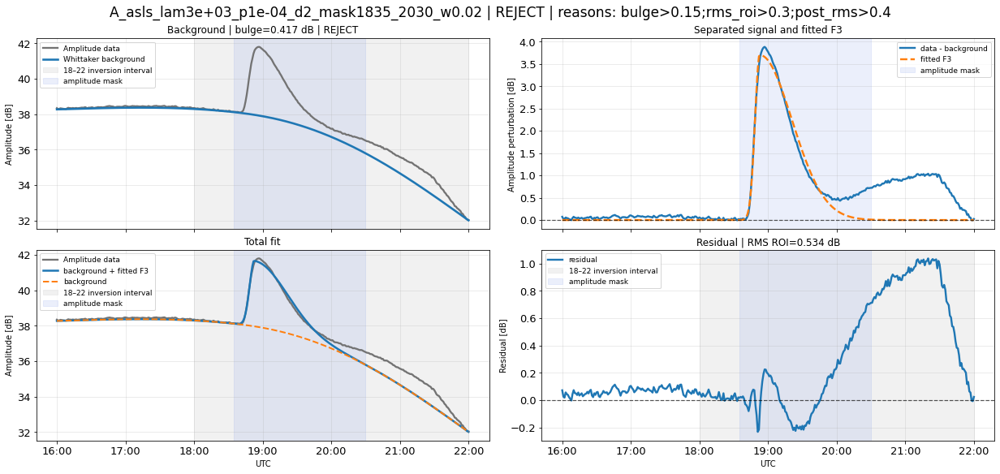

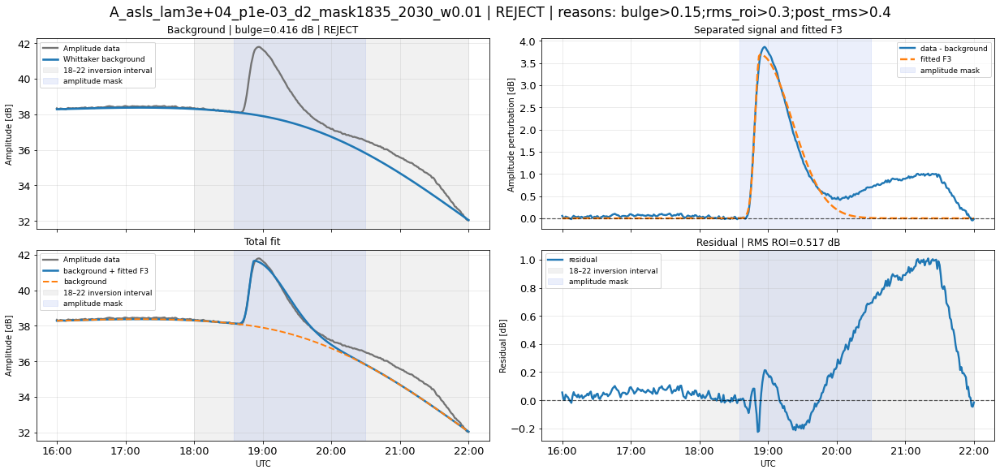

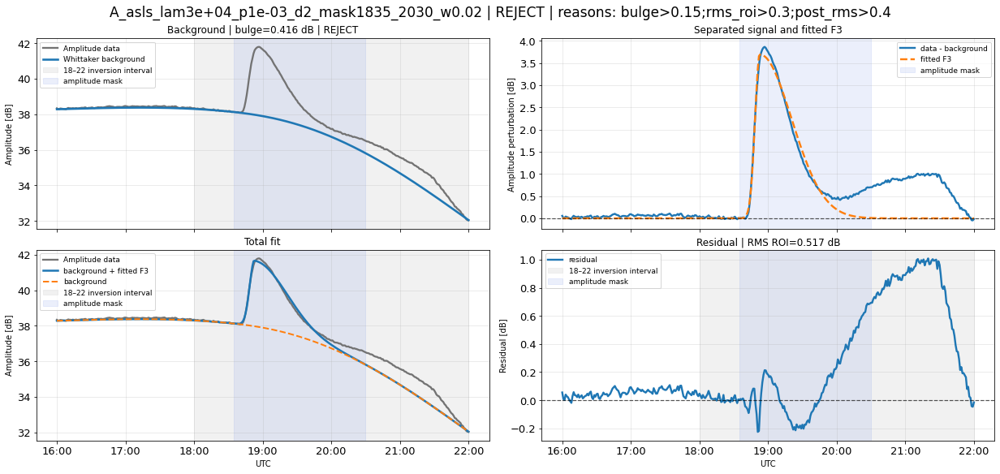

No PASS candidates found.
Least-bad candidate by score: A_asls_lam1e+04_p1e-03_d2_mask1835_2030_w0.01
Reasons: bulge>0.15;rms_roi>0.3;post_rms>0.4
Figures saved in: /home/jp/basefolder_JP/amplitude_whittaker_tests
CSV saved in: amplitude_whittaker_tests/amplitude_whittaker_candidates_summary.csv
Table PNG saved in: amplitude_whittaker_tests/amplitude_whittaker_candidates_summary_table.png
Candidates in: A_whittaker_candidates
Table in: A_whittaker_df


In [12]:
# ============================================================
# AMPLITUDE WHITTAKER TESTS ONLY
# ASLS / IAsLS, fixed mask, hard rejection by bulge + residuals
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import inspect
from pathlib import Path
from pybaselines import Baseline

# ------------------------------------------------------------
# Output
# ------------------------------------------------------------
FIG_DIR_AW = Path("amplitude_whittaker_tests")
FIG_DIR_AW.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Required F3 fitter
# ------------------------------------------------------------
if "_fit_f3_to_perturbation" not in globals():
    raise ValueError(
        "No existe _fit_f3_to_perturbation. "
        "Corre primero la celda donde se definió el ajuste F3 a la perturbación."
    )

# ------------------------------------------------------------
# Plot style
# ------------------------------------------------------------
if "PLOT_STYLE" not in globals():
    PLOT_STYLE = {
        "fs_tick": 13,
        "fs_label": 15,
        "fs_title": 16,
        "fs_legend": 9,
        "alpha_grid": 0.30,
    }

if "date_fmt" not in globals():
    date_fmt = mdates.DateFormatter("%H:%M")

# ------------------------------------------------------------
# Data: amplitude, forced to 16:00–22:00
# ------------------------------------------------------------
if ("time_w" in globals()) and ("A_w" in globals()):
    time_A_raw = pd.to_datetime(time_w)
    A_raw = np.asarray(A_w, dtype=float)
elif ("time_utc" in globals()) and ("A_real" in globals()):
    time_A_raw = pd.to_datetime(time_utc)
    A_raw = np.asarray(A_real, dtype=float)
else:
    raise ValueError("No encuentro time_w/A_w ni time_utc/A_real.")

sort_idx = np.argsort(time_A_raw)
time_A_raw = pd.to_datetime(np.asarray(time_A_raw)[sort_idx])
A_raw = A_raw[sort_idx]

FULL_START = pd.Timestamp("2008-03-25 16:00:00")
FULL_END   = pd.Timestamp("2008-03-25 22:00:00")

full_mask = (time_A_raw >= FULL_START) & (time_A_raw <= FULL_END)

time_A = pd.to_datetime(time_A_raw[full_mask])
A_data = np.asarray(A_raw[full_mask], dtype=float)

if len(A_data) == 0:
    raise ValueError("La ventana 16:00–22:00 quedó vacía.")

t_hours_A = np.array((time_A - time_A[0]).total_seconds() / 3600.0, dtype=float)

# ------------------------------------------------------------
# Windows and mask
# ------------------------------------------------------------
ROI_START = pd.Timestamp("2008-03-25 18:00:00")
ROI_END   = pd.Timestamp("2008-03-25 22:00:00")

MASK_START = pd.Timestamp("2008-03-25 18:35:00")
MASK_END   = pd.Timestamp("2008-03-25 20:30:00")

roi_mask = (time_A >= ROI_START) & (time_A <= ROI_END)
mask_bool = (time_A >= MASK_START) & (time_A <= MASK_END)
pre_mask = time_A < MASK_START
post_mask = time_A > MASK_END

# ------------------------------------------------------------
# Hard thresholds
# ------------------------------------------------------------
THRESH_BULGE_ABS_DB = 0.15
THRESH_RMS_ROI_DB = 0.30
THRESH_PRE_PERT_RMS_DB = 0.15
THRESH_POST_PERT_RMS_DB = 0.40
THRESH_PERT_MIN_DB = -0.20

# ------------------------------------------------------------
# Candidate grid: only amplitude, limited
# ------------------------------------------------------------
METHOD_CONFIGS = [
    {
        "method": "asls",
        "lam_values": [3e3, 1e4, 3e4],
        "p_values": [1e-3, 3e-4, 1e-4],
        "diff_order": 2,
        "flare_weights": [0.01, 0.02],
    },
    {
        "method": "iasls",
        "lam_values": [3e3, 1e4, 3e4],
        "p_values": [1e-3, 3e-4],
        "diff_order": 2,
        "flare_weights": [0.01, 0.02],
    },
]

MAX_ITER = 100
TOL = 1e-4

baseline_fitter_A = Baseline(x_data=t_hours_A)

A_whittaker_candidates = []
failed = []

for cfg in METHOD_CONFIGS:
    method_name = cfg["method"]

    if not hasattr(baseline_fitter_A, method_name):
        failed.append((method_name, "method_not_available"))
        continue

    method_func = getattr(baseline_fitter_A, method_name)
    accepted = set(inspect.signature(method_func).parameters.keys())
    weights_supported = "weights" in accepted

    for lam in cfg["lam_values"]:
        for p in cfg["p_values"]:
            for flare_weight in cfg["flare_weights"]:

                weights = np.ones(len(time_A), dtype=float)
                weights[mask_bool] = flare_weight

                kwargs = {
                    "lam": lam,
                    "p": p,
                    "diff_order": cfg["diff_order"],
                    "max_iter": MAX_ITER,
                    "tol": TOL,
                    "weights": weights,
                }

                clean_kwargs = {k: v for k, v in kwargs.items() if k in accepted}

                try:
                    bg, params = method_func(A_data, **clean_kwargs)

                    pert_raw = A_data - bg
                    pert_f3, f3_params = _fit_f3_to_perturbation(time_A, pert_raw)

                    total_fit = bg + pert_f3
                    residual = A_data - total_fit

                    # Bulge metric inside mask:
                    t0 = (MASK_START - time_A[0]).total_seconds() / 3600.0
                    t1 = (MASK_END - time_A[0]).total_seconds() / 3600.0

                    bg0 = np.interp(t0, t_hours_A, bg)
                    bg1 = np.interp(t1, t_hours_A, bg)

                    line_inside = np.interp(t_hours_A[mask_bool], [t0, t1], [bg0, bg1])
                    bg_minus_line = bg[mask_bool] - line_inside

                    bulge_pos = float(np.nanmax(bg_minus_line))
                    bulge_neg = float(np.nanmin(bg_minus_line))
                    bulge_abs = float(np.nanmax(np.abs(bg_minus_line)))

                    rms_resid_all = float(np.sqrt(np.nanmean(residual**2)))
                    rms_resid_roi = float(np.sqrt(np.nanmean(residual[roi_mask]**2)))
                    max_abs_resid_roi = float(np.nanmax(np.abs(residual[roi_mask])))

                    pre_pert_rms = float(np.sqrt(np.nanmean(pert_raw[pre_mask]**2))) if np.any(pre_mask) else np.nan
                    post_pert_rms = float(np.sqrt(np.nanmean(pert_raw[post_mask]**2))) if np.any(post_mask) else np.nan

                    pert_max = float(np.nanmax(pert_raw))
                    pert_min = float(np.nanmin(pert_raw))
                    pert_peak_time = time_A[int(np.nanargmax(pert_raw))]

                    reasons = []

                    if not weights_supported:
                        reasons.append("weights_not_supported")

                    if bulge_abs > THRESH_BULGE_ABS_DB:
                        reasons.append(f"bulge>{THRESH_BULGE_ABS_DB}")

                    if rms_resid_roi > THRESH_RMS_ROI_DB:
                        reasons.append(f"rms_roi>{THRESH_RMS_ROI_DB}")

                    if pre_pert_rms > THRESH_PRE_PERT_RMS_DB:
                        reasons.append(f"pre_rms>{THRESH_PRE_PERT_RMS_DB}")

                    if post_pert_rms > THRESH_POST_PERT_RMS_DB:
                        reasons.append(f"post_rms>{THRESH_POST_PERT_RMS_DB}")

                    if pert_min < THRESH_PERT_MIN_DB:
                        reasons.append(f"pert_min<{THRESH_PERT_MIN_DB}")

                    status = "PASS" if len(reasons) == 0 else "REJECT"

                    score = (
                        bulge_abs / THRESH_BULGE_ABS_DB
                        + rms_resid_roi / THRESH_RMS_ROI_DB
                        + pre_pert_rms / THRESH_PRE_PERT_RMS_DB
                        + post_pert_rms / THRESH_POST_PERT_RMS_DB
                        + max(0.0, -pert_min) / abs(THRESH_PERT_MIN_DB)
                    )

                    cid = (
                        f"A_{method_name}"
                        f"_lam{lam:.0e}"
                        f"_p{p:.0e}"
                        f"_d{cfg['diff_order']}"
                        f"_mask1835_2030"
                        f"_w{flare_weight:g}"
                    )

                    A_whittaker_candidates.append({
                        "id": cid,
                        "status": status,
                        "reject_reasons": ";".join(reasons),
                        "method": method_name,
                        "lam": lam,
                        "p": p,
                        "diff_order": cfg["diff_order"],
                        "mask_start": MASK_START,
                        "mask_end": MASK_END,
                        "flare_weight": flare_weight,
                        "weights_supported": weights_supported,
                        "background": bg,
                        "perturbation_raw": pert_raw,
                        "perturbation": pert_f3,
                        "f3_fit": pert_f3,
                        "total_fit": total_fit,
                        "residual": residual,
                        "params": params,
                        "f3_params": f3_params,
                        "bg_bulge_pos": bulge_pos,
                        "bg_bulge_neg": bulge_neg,
                        "bg_bulge_abs": bulge_abs,
                        "rms_residual_all": rms_resid_all,
                        "rms_residual_roi": rms_resid_roi,
                        "max_abs_residual_roi": max_abs_resid_roi,
                        "pre_flare_pert_rms": pre_pert_rms,
                        "post_mask_pert_rms": post_pert_rms,
                        "pert_max": pert_max,
                        "pert_min": pert_min,
                        "pert_peak_time": pert_peak_time,
                        "score": score,
                    })

                except Exception as e:
                    failed.append((method_name, lam, p, flare_weight, repr(e)))

# ------------------------------------------------------------
# Summary table
# ------------------------------------------------------------
A_whittaker_df = pd.DataFrame([
    {
        "status": c["status"],
        "id": c["id"],
        "reject_reasons": c["reject_reasons"],
        "method": c["method"],
        "lam": c["lam"],
        "p": c["p"],
        "diff_order": c["diff_order"],
        "w": c["flare_weight"],
        "weights_supported": c["weights_supported"],
        "bg_bulge_abs": c["bg_bulge_abs"],
        "bg_bulge_pos": c["bg_bulge_pos"],
        "bg_bulge_neg": c["bg_bulge_neg"],
        "rms_residual_roi": c["rms_residual_roi"],
        "max_abs_residual_roi": c["max_abs_residual_roi"],
        "pre_flare_pert_rms": c["pre_flare_pert_rms"],
        "post_mask_pert_rms": c["post_mask_pert_rms"],
        "pert_max": c["pert_max"],
        "pert_min": c["pert_min"],
        "pert_peak_time": c["pert_peak_time"],
        "F3_amp": c["f3_params"]["amp"],
        "F3_t_pk": c["f3_params"]["t_pk"],
        "F3_tau_u": c["f3_params"]["tau_u"],
        "F3_tau_d": c["f3_params"]["tau_d"],
        "F3_eps": c["f3_params"]["eps"],
        "score": c["score"],
    }
    for c in A_whittaker_candidates
])

A_whittaker_df = A_whittaker_df.sort_values(
    ["status", "bg_bulge_abs", "rms_residual_roi", "score"],
    ascending=[True, True, True, True],
).reset_index(drop=True)

display(A_whittaker_df)

A_whittaker_df.to_csv(
    FIG_DIR_AW / "amplitude_whittaker_candidates_summary.csv",
    index=False,
)

# Table as PNG
table_show = A_whittaker_df.copy()
float_cols = [
    "lam", "p", "w",
    "bg_bulge_abs", "bg_bulge_pos", "bg_bulge_neg",
    "rms_residual_roi", "max_abs_residual_roi",
    "pre_flare_pert_rms", "post_mask_pert_rms",
    "pert_max", "pert_min",
    "F3_amp", "F3_t_pk", "F3_tau_u", "F3_tau_d", "F3_eps",
    "score",
]

for col in float_cols:
    if col in table_show.columns:
        table_show[col] = table_show[col].map(lambda v: f"{v:.4g}" if pd.notna(v) else "")

if "pert_peak_time" in table_show.columns:
    table_show["pert_peak_time"] = pd.to_datetime(table_show["pert_peak_time"]).dt.strftime("%H:%M")

fig, ax = plt.subplots(
    1, 1,
    figsize=(24, 0.45 * len(table_show) + 2.5),
    facecolor="white",
)
ax.axis("off")

tbl = ax.table(
    cellText=table_show.values,
    colLabels=table_show.columns,
    loc="center",
    cellLoc="center",
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(7)
tbl.scale(1.0, 1.25)

ax.set_title(
    "Amplitude Whittaker candidates: hard-filtered summary",
    fontsize=14,
    pad=16,
)

fig.savefig(
    FIG_DIR_AW / "amplitude_whittaker_candidates_summary_table.png",
    dpi=200,
    bbox_inches="tight",
)

plt.show()

# ------------------------------------------------------------
# Global plots
# ------------------------------------------------------------
fig, ax = plt.subplots(
    3, 1,
    figsize=(17, 13),
    sharex=True,
    constrained_layout=True,
    facecolor="white",
)

ax[0].plot(time_A, A_data, lw=2.3, color="0.45", alpha=0.75, label="Amplitude data")

for c in A_whittaker_candidates:
    alpha = 0.95 if c["status"] == "PASS" else 0.28
    lw = 2.4 if c["status"] == "PASS" else 1.2
    ls = "-" if c["status"] == "PASS" else "--"
    label = f"{c['status']} | {c['id']} | bulge={c['bg_bulge_abs']:.3f}"

    ax[0].plot(time_A, c["background"], lw=lw, alpha=alpha, ls=ls, label=label)

ax[0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[0].axvspan(MASK_START, MASK_END, color="royalblue", alpha=0.10, label="amplitude mask")
ax[0].set_title("Amplitude Whittaker backgrounds", fontsize=PLOT_STYLE["fs_title"])
ax[0].set_ylabel("Amplitude [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0].legend(fontsize=7, frameon=True, ncol=2)

for c in A_whittaker_candidates:
    alpha = 0.95 if c["status"] == "PASS" else 0.28
    lw = 2.4 if c["status"] == "PASS" else 1.2
    ls = "-" if c["status"] == "PASS" else "--"
    label = f"{c['status']} | {c['id']}"

    ax[1].plot(time_A, c["perturbation_raw"], lw=lw, alpha=alpha, ls=ls, label=label)

ax[1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[1].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[1].axvspan(MASK_START, MASK_END, color="royalblue", alpha=0.10, label="amplitude mask")
ax[1].set_title("Amplitude raw separated signal = data - background", fontsize=PLOT_STYLE["fs_title"])
ax[1].set_ylabel("Amplitude perturbation [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1].legend(fontsize=7, frameon=True, ncol=2)

for c in A_whittaker_candidates:
    alpha = 0.95 if c["status"] == "PASS" else 0.28
    lw = 2.4 if c["status"] == "PASS" else 1.2
    ls = "-" if c["status"] == "PASS" else "--"
    label = f"{c['status']} | {c['id']} | RMS={c['rms_residual_roi']:.3f}"

    ax[2].plot(time_A, c["residual"], lw=lw, alpha=alpha, ls=ls, label=label)

ax[2].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[2].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[2].axvspan(MASK_START, MASK_END, color="royalblue", alpha=0.10, label="amplitude mask")
ax[2].set_title("Amplitude residual = data - (background + fitted F3)", fontsize=PLOT_STYLE["fs_title"])
ax[2].set_ylabel("Residual [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[2].set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])
ax[2].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[2].legend(fontsize=7, frameon=True, ncol=2)

for a in ax:
    a.xaxis.set_major_formatter(date_fmt)
    a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

fig.savefig(
    FIG_DIR_AW / "001_amplitude_whittaker_global_candidates.png",
    dpi=200,
    bbox_inches="tight",
)

plt.show()

# ------------------------------------------------------------
# Individual panels: PASS first; if no PASS, best 8 by score
# ------------------------------------------------------------
pass_candidates = [c for c in A_whittaker_candidates if c["status"] == "PASS"]

if len(pass_candidates) > 0:
    candidates_to_plot = pass_candidates
else:
    candidates_to_plot = sorted(A_whittaker_candidates, key=lambda c: c["score"])[:8]

for idx, c in enumerate(candidates_to_plot, start=1):

    fig, ax = plt.subplots(
        2, 2,
        figsize=(17, 8),
        sharex=True,
        constrained_layout=True,
        facecolor="white",
    )

    ax[0, 0].plot(time_A, A_data, lw=2.3, color="0.45", label="Amplitude data")
    ax[0, 0].plot(time_A, c["background"], lw=2.6, label="Whittaker background")
    ax[0, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[0, 0].axvspan(MASK_START, MASK_END, color="royalblue", alpha=0.10, label="amplitude mask")
    ax[0, 0].set_title(f"Background | bulge={c['bg_bulge_abs']:.3f} dB | {c['status']}")
    ax[0, 0].set_ylabel("Amplitude [dB]")
    ax[0, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[0, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    ax[0, 1].plot(time_A, c["perturbation_raw"], lw=2.4, label="data - background")
    ax[0, 1].plot(time_A, c["f3_fit"], lw=2.4, ls="--", label="fitted F3")
    ax[0, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
    ax[0, 1].axvspan(MASK_START, MASK_END, color="royalblue", alpha=0.10, label="amplitude mask")
    ax[0, 1].set_title("Separated signal and fitted F3")
    ax[0, 1].set_ylabel("Amplitude perturbation [dB]")
    ax[0, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[0, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    ax[1, 0].plot(time_A, A_data, lw=2.3, color="0.45", label="Amplitude data")
    ax[1, 0].plot(time_A, c["total_fit"], lw=2.5, label="background + fitted F3")
    ax[1, 0].plot(time_A, c["background"], lw=2.0, ls="--", label="background")
    ax[1, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[1, 0].axvspan(MASK_START, MASK_END, color="royalblue", alpha=0.10, label="amplitude mask")
    ax[1, 0].set_title("Total fit")
    ax[1, 0].set_ylabel("Amplitude [dB]")
    ax[1, 0].set_xlabel("UTC")
    ax[1, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[1, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    ax[1, 1].plot(time_A, c["residual"], lw=2.4, label="residual")
    ax[1, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
    ax[1, 1].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[1, 1].axvspan(MASK_START, MASK_END, color="royalblue", alpha=0.10, label="amplitude mask")
    ax[1, 1].set_title(f"Residual | RMS ROI={c['rms_residual_roi']:.3f} dB")
    ax[1, 1].set_ylabel("Residual [dB]")
    ax[1, 1].set_xlabel("UTC")
    ax[1, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[1, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    for a in ax.flat:
        a.xaxis.set_major_formatter(date_fmt)
        a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

    fig.suptitle(
        f"{c['id']} | {c['status']} | reasons: {c['reject_reasons']}",
        fontsize=PLOT_STYLE["fs_title"] + 1,
    )

    fig.savefig(
        FIG_DIR_AW / f"amplitude_whittaker_candidate_{idx:02d}_{c['id']}.png",
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()

# ------------------------------------------------------------
# Suggested candidate
# ------------------------------------------------------------
if len(pass_candidates) > 0:
    A_suggested = sorted(pass_candidates, key=lambda c: c["score"])[0]
    print("Suggested PASS candidate:", A_suggested["id"])
else:
    A_suggested = sorted(A_whittaker_candidates, key=lambda c: c["score"])[0]
    print("No PASS candidates found.")
    print("Least-bad candidate by score:", A_suggested["id"])
    print("Reasons:", A_suggested["reject_reasons"])

print("Figures saved in:", FIG_DIR_AW.resolve())
print("CSV saved in:", FIG_DIR_AW / "amplitude_whittaker_candidates_summary.csv")
print("Table PNG saved in:", FIG_DIR_AW / "amplitude_whittaker_candidates_summary_table.png")
print("Candidates in: A_whittaker_candidates")
print("Table in: A_whittaker_df")

if failed:
    print("\nFailures:")
    for item in failed[:20]:
        print(item)

In [13]:
FIG_DIR_AW

PosixPath('amplitude_whittaker_tests')

,status,id,reject_reasons,method,lam,p,diff_order,mask_start,mask_end,w,...,post_mask_pert_rms,pert_max,pert_min,pert_peak_time,F3_amp,F3_t_pk,F3_tau_u,F3_tau_d,F3_eps,score
0,REJECT,A_iasls_lam1e+05_p1e-04_d2_mask1825_2130_w0.001,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,100000.0,0.0001,2,18:25,21:30,0.001,...,0.965021,6.572509,-0.000005,2008-03-25 18:57:00,4.554932,3.076859,0.700000,1.612840,0.700,15.130448
1,REJECT,A_iasls_lam1e+05_p3e-04_d2_mask1835_2030_w0.001,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,100000.0,0.0003,2,18:35,20:30,0.001,...,2.106936,6.571964,-0.000043,2008-03-25 18:57:00,4.554413,3.076942,0.700000,1.612751,0.700,18.514064
2,REJECT,A_iasls_lam1e+05_p3e-04_d2_mask1835_2030_w0.003,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,100000.0,0.0003,2,18:35,20:30,0.003,...,2.106936,6.571964,-0.000043,2008-03-25 18:57:00,4.554413,3.076942,0.700000,1.612751,0.700,18.514064
3,REJECT,A_iasls_lam1e+05_p3e-04_d2_mask1835_2030_w0.01,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,100000.0,0.0003,2,18:35,20:30,0.010,...,2.106936,6.571964,-0.000043,2008-03-25 18:57:00,4.554413,3.076942,0.700000,1.612751,0.700,18.514064
4,REJECT,A_iasls_lam1e+05_p3e-04_d2_mask1825_2030_w0.001,rms_roi>0.3;pre_rms>0.15;post_rms>0.4,iasls,100000.0,0.0003,2,18:25,20:30,0.001,...,2.106936,6.571964,-0.000043,2008-03-25 18:57:00,4.554413,3.076942,0.700000,1.612751,0.700,17.983466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,REJECT,A_iasls_lam1e+04_p1e-04_d2_mask1825_2130_w0.003,bulge>0.15;rms_roi>0.3,iasls,10000.0,0.0001,2,18:25,21:30,0.003,...,0.393044,3.781692,-0.027662,2008-03-25 18:57:00,3.762843,2.896032,0.078883,0.379386,0.005,11.889989
500,REJECT,A_iasls_lam1e+04_p1e-04_d2_mask1825_2130_w0.01,bulge>0.15;rms_roi>0.3,iasls,10000.0,0.0001,2,18:25,21:30,0.010,...,0.393044,3.781692,-0.027662,2008-03-25 18:57:00,3.762843,2.896032,0.078883,0.379386,0.005,11.889989
501,REJECT,A_asls_lam3e+03_p1e-03_d2_mask1825_2130_w0.001,bulge>0.15,asls,3000.0,0.0010,2,18:25,21:30,0.001,...,0.344363,3.663005,-0.046861,2008-03-25 18:57:00,3.648891,2.894328,0.077065,0.362723,0.005,11.926598
502,REJECT,A_asls_lam3e+03_p1e-03_d2_mask1825_2130_w0.003,bulge>0.15,asls,3000.0,0.0010,2,18:25,21:30,0.003,...,0.344363,3.663005,-0.046861,2008-03-25 18:57:00,3.648891,2.894328,0.077065,0.362723,0.005,11.926598


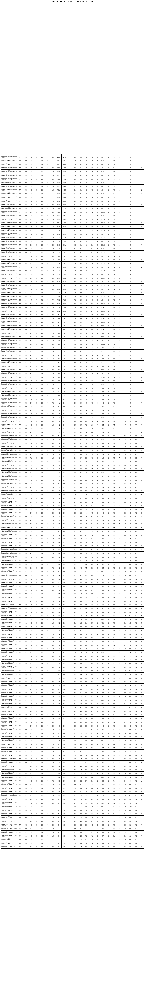

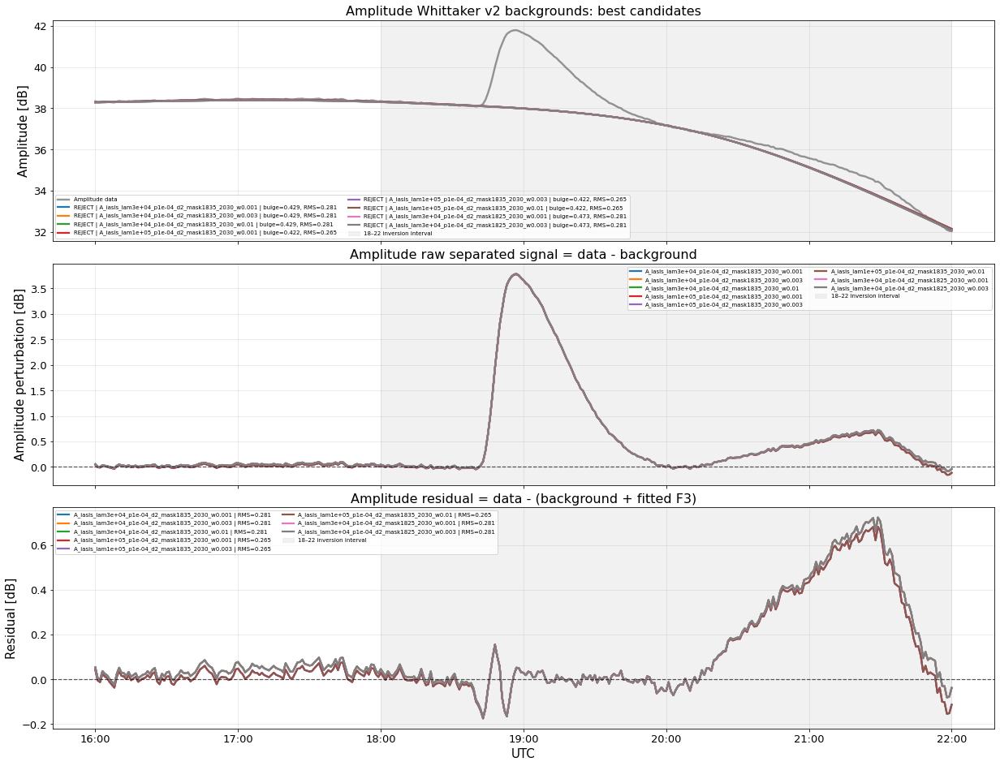

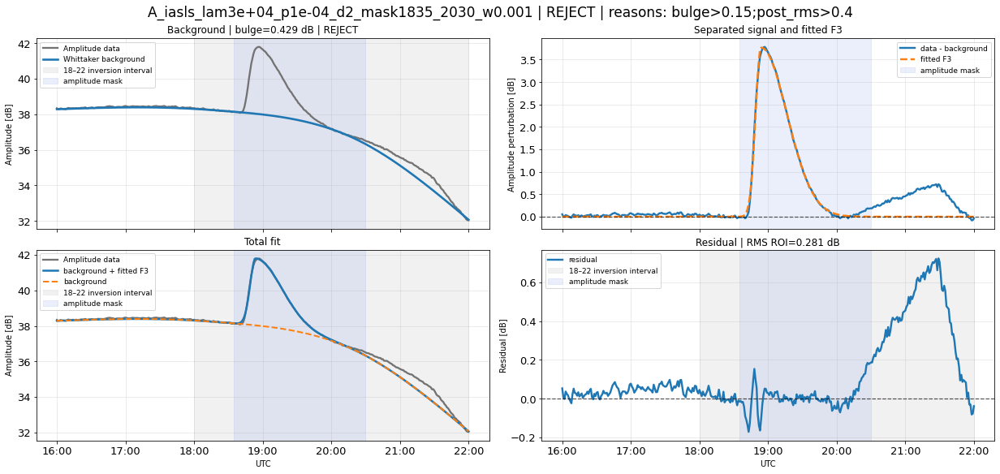

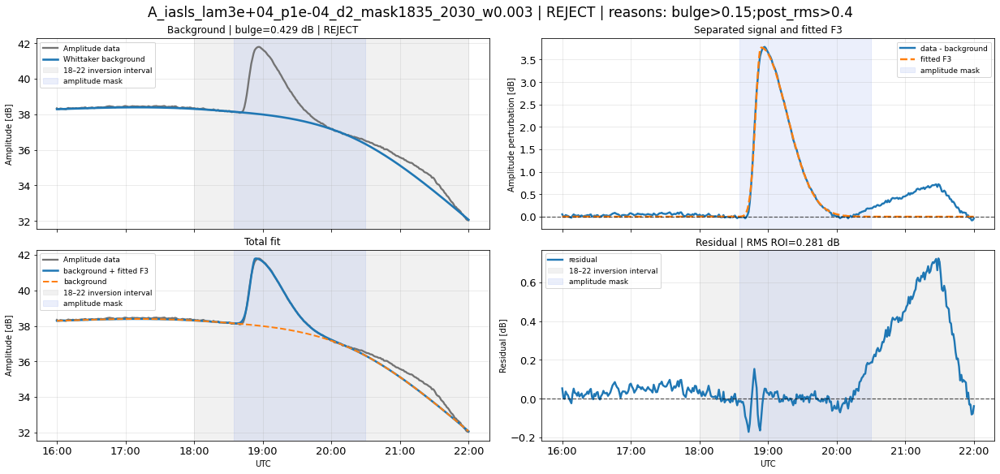

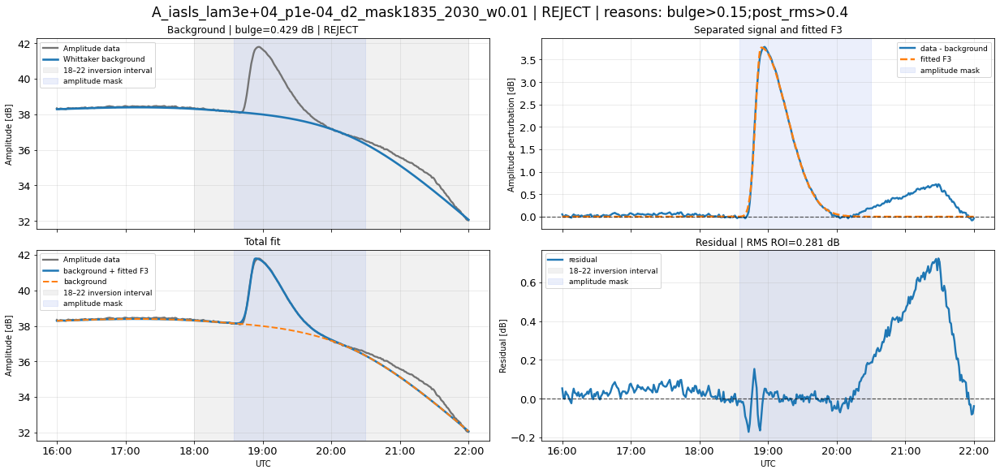

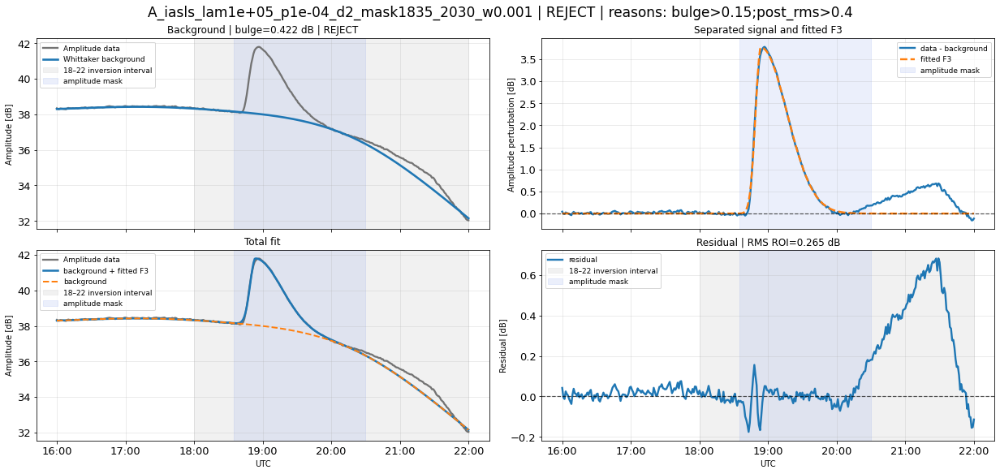

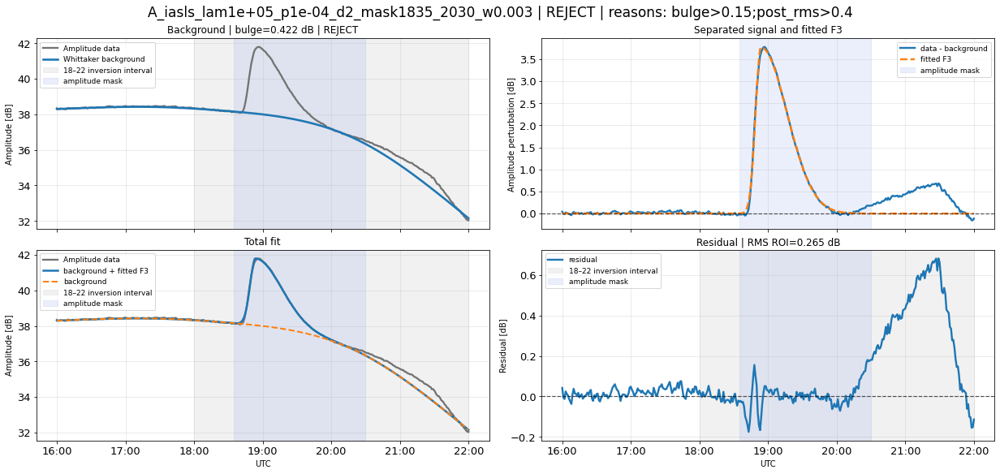

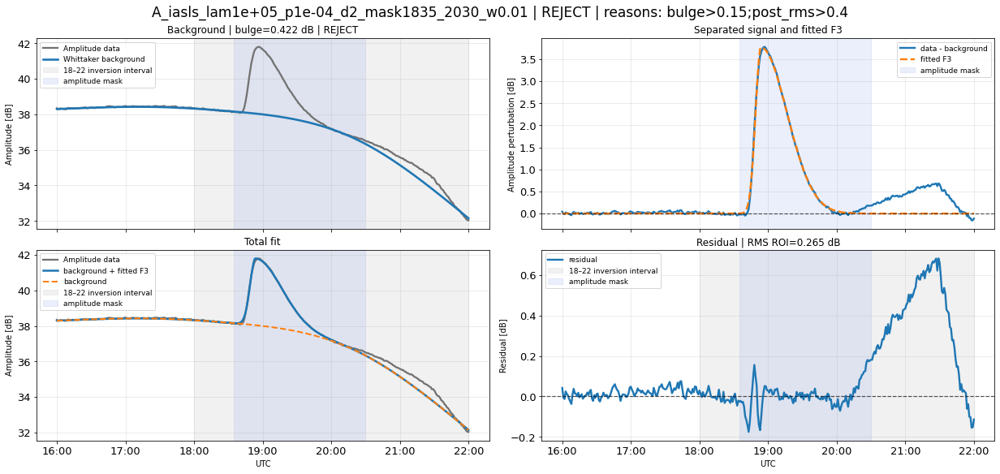

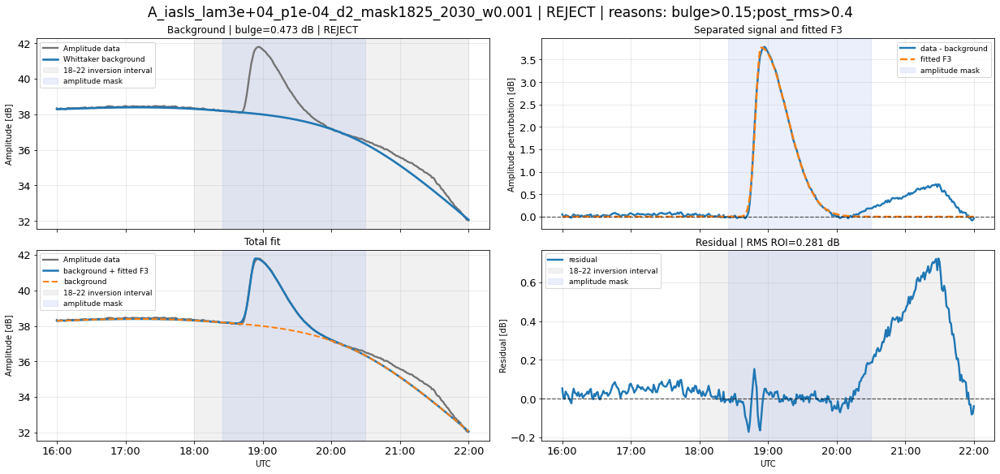

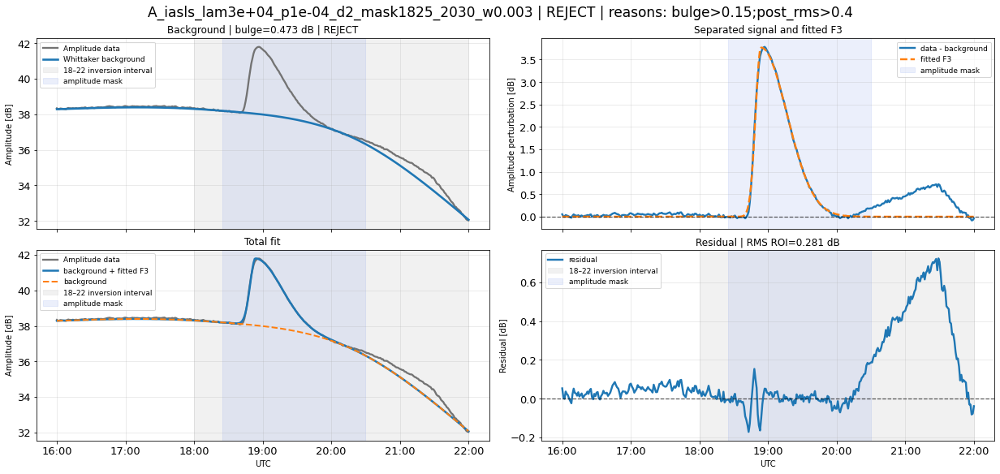

No PASS candidates found.
Least-bad candidate by score: A_iasls_lam3e+04_p1e-04_d2_mask1835_2030_w0.001
Reasons: bulge>0.15;post_rms>0.4
Figures saved in: /home/jp/basefolder_JP/amplitude_whittaker_tests_v2
CSV saved in: amplitude_whittaker_tests_v2/amplitude_whittaker_candidates_v2_summary.csv
Table PNG saved in: amplitude_whittaker_tests_v2/amplitude_whittaker_candidates_v2_summary_table.png
Candidates in: A_whittaker_candidates_v2
Table in: A_whittaker_df_v2


In [14]:
# ============================================================
# AMPLITUDE WHITTAKER TESTS v2:
# focus on mask geometry + stronger downweighting
#
# Goal:
#   Find Whittaker-only amplitude backgrounds with:
#   - small bulge during flare
#   - small post-flare artificial tail
#   - reasonable residual after background + fitted F3
#
# Output:
#   amplitude_whittaker_tests_v2/
#   - CSV summary
#   - PNG summary table
#   - global plots
#   - individual plots for best candidates
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import inspect
from pathlib import Path
from scipy.optimize import least_squares
from pybaselines import Baseline

# ------------------------------------------------------------
# Output
# ------------------------------------------------------------
FIG_DIR_AW2 = Path("amplitude_whittaker_tests_v2")
FIG_DIR_AW2.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Plot style
# ------------------------------------------------------------
if "PLOT_STYLE" not in globals():
    PLOT_STYLE = {
        "fs_tick": 13,
        "fs_label": 15,
        "fs_title": 16,
        "fs_legend": 9,
        "alpha_grid": 0.30,
    }

if "date_fmt" not in globals():
    date_fmt = mdates.DateFormatter("%H:%M")

# ------------------------------------------------------------
# Minimal F3 fitter, self-contained
# ------------------------------------------------------------
def _sigmoid_local(z):
    z = np.clip(z, -80, 80)
    return 1.0 / (1.0 + np.exp(-z))

def _f3_unit_local(t, t_pk, tau_u, tau_d, eps):
    tau_u = max(float(tau_u), 1e-8)
    tau_d = max(float(tau_d), 1e-8)
    eps   = max(float(eps),   1e-8)

    w = tau_u + (tau_d - tau_u) * _sigmoid_local((t - t_pk) / eps)
    y = np.exp(-0.5 * ((t - t_pk) / w) ** 2)

    ymax = np.nanmax(y)
    if ymax > 0:
        y = y / ymax

    return y

def _fit_f3_to_perturbation_local(time_array, y):
    time_array = pd.to_datetime(time_array)
    y = np.asarray(y, dtype=float)

    t = np.array((time_array - time_array[0]).total_seconds() / 3600.0, dtype=float)

    idx_pk = int(np.nanargmax(y))
    amp0 = max(float(y[idx_pk]), 1e-3)
    tpk0 = float(t[idx_pk])

    p0 = np.array([
        amp0,
        tpk0,
        0.08,
        0.70,
        0.05,
    ])

    lower = np.array([
        0.0,
        max(np.nanmin(t), tpk0 - 0.7),
        0.005,
        0.03,
        0.005,
    ])

    upper = np.array([
        max(2.0 * np.nanmax(y), 1.0),
        min(np.nanmax(t), tpk0 + 0.7),
        0.70,
        3.00,
        0.70,
    ])

    def residual_fun(p):
        amp, t_pk, tau_u, tau_d, eps = p
        return amp * _f3_unit_local(t, t_pk, tau_u, tau_d, eps) - y

    res = least_squares(
        residual_fun,
        p0,
        bounds=(lower, upper),
        max_nfev=50000,
        xtol=1e-10,
        ftol=1e-10,
        gtol=1e-10,
    )

    amp, t_pk, tau_u, tau_d, eps = res.x
    y_fit = amp * _f3_unit_local(t, t_pk, tau_u, tau_d, eps)

    return y_fit, {
        "amp": amp,
        "t_pk": t_pk,
        "tau_u": tau_u,
        "tau_d": tau_d,
        "eps": eps,
        "cost": res.cost,
        "success": res.success,
    }

# ------------------------------------------------------------
# Data: amplitude, forced to 16:00–22:00
# ------------------------------------------------------------
if ("time_w" in globals()) and ("A_w" in globals()):
    time_A_raw = pd.to_datetime(time_w)
    A_raw = np.asarray(A_w, dtype=float)
elif ("time_utc" in globals()) and ("A_real" in globals()):
    time_A_raw = pd.to_datetime(time_utc)
    A_raw = np.asarray(A_real, dtype=float)
else:
    raise ValueError("No encuentro time_w/A_w ni time_utc/A_real.")

sort_idx = np.argsort(time_A_raw)
time_A_raw = pd.to_datetime(np.asarray(time_A_raw)[sort_idx])
A_raw = A_raw[sort_idx]

FULL_START = pd.Timestamp("2008-03-25 16:00:00")
FULL_END   = pd.Timestamp("2008-03-25 22:00:00")

full_mask = (time_A_raw >= FULL_START) & (time_A_raw <= FULL_END)

time_A = pd.to_datetime(time_A_raw[full_mask])
A_data = np.asarray(A_raw[full_mask], dtype=float)

if len(A_data) == 0:
    raise ValueError("La ventana 16:00–22:00 quedó vacía.")

t_hours_A = np.array((time_A - time_A[0]).total_seconds() / 3600.0, dtype=float)

# ------------------------------------------------------------
# Windows
# ------------------------------------------------------------
ROI_START_A = pd.Timestamp("2008-03-25 18:00:00")
ROI_END_A   = pd.Timestamp("2008-03-25 22:00:00")

MASK_START_VALUES = [
    pd.Timestamp("2008-03-25 18:25:00"),
    pd.Timestamp("2008-03-25 18:35:00"),
]

MASK_END_VALUES = [
    pd.Timestamp("2008-03-25 20:30:00"),
    pd.Timestamp("2008-03-25 21:00:00"),
    pd.Timestamp("2008-03-25 21:30:00"),
]

roi_mask = (time_A >= ROI_START_A) & (time_A <= ROI_END_A)

# ------------------------------------------------------------
# Thresholds
# ------------------------------------------------------------
THRESH_BULGE_ABS_DB = 0.15
THRESH_RMS_ROI_DB = 0.30
THRESH_PRE_PERT_RMS_DB = 0.15
THRESH_POST_PERT_RMS_DB = 0.40
THRESH_PERT_MIN_DB = -0.20

# ------------------------------------------------------------
# Candidate grid: still limited, but focused on mask geometry
# ------------------------------------------------------------
METHOD_CONFIGS = [
    {
        "method": "asls",
        "lam_values": [3e3, 1e4, 3e4, 1e5],
        "p_values": [1e-3, 3e-4, 1e-4, 3e-5],
        "diff_order": 2,
        "flare_weights": [0.001, 0.003, 0.01],
    },
    {
        "method": "iasls",
        "lam_values": [3e3, 1e4, 3e4, 1e5],
        "p_values": [1e-3, 3e-4, 1e-4],
        "diff_order": 2,
        "flare_weights": [0.001, 0.003, 0.01],
    },
]

MAX_ITER = 100
TOL = 1e-4

baseline_fitter_A = Baseline(x_data=t_hours_A)

A_whittaker_candidates_v2 = []
failed_v2 = []

for cfg in METHOD_CONFIGS:
    method_name = cfg["method"]

    if not hasattr(baseline_fitter_A, method_name):
        failed_v2.append((method_name, "method_not_available"))
        continue

    method_func = getattr(baseline_fitter_A, method_name)
    accepted = set(inspect.signature(method_func).parameters.keys())
    weights_supported = "weights" in accepted

    if not weights_supported:
        failed_v2.append((method_name, "weights_not_supported"))
        continue

    for mask_start in MASK_START_VALUES:
        for mask_end in MASK_END_VALUES:

            mask_bool = (time_A >= mask_start) & (time_A <= mask_end)
            pre_mask = time_A < mask_start
            post_mask = time_A > mask_end

            for lam in cfg["lam_values"]:
                for p in cfg["p_values"]:
                    for flare_weight in cfg["flare_weights"]:

                        weights = np.ones(len(time_A), dtype=float)
                        weights[mask_bool] = flare_weight

                        kwargs = {
                            "lam": lam,
                            "p": p,
                            "diff_order": cfg["diff_order"],
                            "max_iter": MAX_ITER,
                            "tol": TOL,
                            "weights": weights,
                        }

                        clean_kwargs = {k: v for k, v in kwargs.items() if k in accepted}

                        try:
                            bg, params = method_func(A_data, **clean_kwargs)

                            pert_raw = A_data - bg
                            pert_f3, f3_params = _fit_f3_to_perturbation_local(time_A, pert_raw)

                            total_fit = bg + pert_f3
                            residual = A_data - total_fit

                            # Bulge metric inside mask:
                            t0 = (mask_start - time_A[0]).total_seconds() / 3600.0
                            t1 = (mask_end   - time_A[0]).total_seconds() / 3600.0

                            bg0 = np.interp(t0, t_hours_A, bg)
                            bg1 = np.interp(t1, t_hours_A, bg)

                            line_inside = np.interp(t_hours_A[mask_bool], [t0, t1], [bg0, bg1])
                            bg_minus_line = bg[mask_bool] - line_inside

                            bulge_pos = float(np.nanmax(bg_minus_line))
                            bulge_neg = float(np.nanmin(bg_minus_line))
                            bulge_abs = float(np.nanmax(np.abs(bg_minus_line)))

                            rms_resid_all = float(np.sqrt(np.nanmean(residual**2)))
                            rms_resid_roi = float(np.sqrt(np.nanmean(residual[roi_mask]**2)))
                            max_abs_resid_roi = float(np.nanmax(np.abs(residual[roi_mask])))

                            pre_pert_rms = float(np.sqrt(np.nanmean(pert_raw[pre_mask]**2))) if np.any(pre_mask) else np.nan
                            post_pert_rms = float(np.sqrt(np.nanmean(pert_raw[post_mask]**2))) if np.any(post_mask) else np.nan

                            pert_max = float(np.nanmax(pert_raw))
                            pert_min = float(np.nanmin(pert_raw))
                            pert_peak_time = time_A[int(np.nanargmax(pert_raw))]

                            reasons = []

                            if bulge_abs > THRESH_BULGE_ABS_DB:
                                reasons.append(f"bulge>{THRESH_BULGE_ABS_DB}")

                            if rms_resid_roi > THRESH_RMS_ROI_DB:
                                reasons.append(f"rms_roi>{THRESH_RMS_ROI_DB}")

                            if pre_pert_rms > THRESH_PRE_PERT_RMS_DB:
                                reasons.append(f"pre_rms>{THRESH_PRE_PERT_RMS_DB}")

                            if post_pert_rms > THRESH_POST_PERT_RMS_DB:
                                reasons.append(f"post_rms>{THRESH_POST_PERT_RMS_DB}")

                            if pert_min < THRESH_PERT_MIN_DB:
                                reasons.append(f"pert_min<{THRESH_PERT_MIN_DB}")

                            status = "PASS" if len(reasons) == 0 else "REJECT"

                            score = (
                                bulge_abs / THRESH_BULGE_ABS_DB
                                + rms_resid_roi / THRESH_RMS_ROI_DB
                                + pre_pert_rms / THRESH_PRE_PERT_RMS_DB
                                + post_pert_rms / THRESH_POST_PERT_RMS_DB
                                + max(0.0, -pert_min) / abs(THRESH_PERT_MIN_DB)
                            )

                            cid = (
                                f"A_{method_name}"
                                f"_lam{lam:.0e}"
                                f"_p{p:.0e}"
                                f"_d{cfg['diff_order']}"
                                f"_mask{mask_start.strftime('%H%M')}_{mask_end.strftime('%H%M')}"
                                f"_w{flare_weight:g}"
                            )

                            A_whittaker_candidates_v2.append({
                                "id": cid,
                                "status": status,
                                "reject_reasons": ";".join(reasons),
                                "method": method_name,
                                "lam": lam,
                                "p": p,
                                "diff_order": cfg["diff_order"],
                                "mask_start": mask_start,
                                "mask_end": mask_end,
                                "flare_weight": flare_weight,
                                "background": bg,
                                "perturbation_raw": pert_raw,
                                "perturbation": pert_f3,
                                "f3_fit": pert_f3,
                                "total_fit": total_fit,
                                "residual": residual,
                                "params": params,
                                "f3_params": f3_params,
                                "bg_bulge_pos": bulge_pos,
                                "bg_bulge_neg": bulge_neg,
                                "bg_bulge_abs": bulge_abs,
                                "rms_residual_all": rms_resid_all,
                                "rms_residual_roi": rms_resid_roi,
                                "max_abs_residual_roi": max_abs_resid_roi,
                                "pre_flare_pert_rms": pre_pert_rms,
                                "post_mask_pert_rms": post_pert_rms,
                                "pert_max": pert_max,
                                "pert_min": pert_min,
                                "pert_peak_time": pert_peak_time,
                                "score": score,
                            })

                        except Exception as e:
                            failed_v2.append((method_name, lam, p, mask_start, mask_end, flare_weight, repr(e)))

# ------------------------------------------------------------
# Summary table
# ------------------------------------------------------------
A_whittaker_df_v2 = pd.DataFrame([
    {
        "status": c["status"],
        "id": c["id"],
        "reject_reasons": c["reject_reasons"],
        "method": c["method"],
        "lam": c["lam"],
        "p": c["p"],
        "diff_order": c["diff_order"],
        "mask_start": c["mask_start"].strftime("%H:%M"),
        "mask_end": c["mask_end"].strftime("%H:%M"),
        "w": c["flare_weight"],
        "bg_bulge_abs": c["bg_bulge_abs"],
        "bg_bulge_pos": c["bg_bulge_pos"],
        "bg_bulge_neg": c["bg_bulge_neg"],
        "rms_residual_roi": c["rms_residual_roi"],
        "max_abs_residual_roi": c["max_abs_residual_roi"],
        "pre_flare_pert_rms": c["pre_flare_pert_rms"],
        "post_mask_pert_rms": c["post_mask_pert_rms"],
        "pert_max": c["pert_max"],
        "pert_min": c["pert_min"],
        "pert_peak_time": c["pert_peak_time"],
        "F3_amp": c["f3_params"]["amp"],
        "F3_t_pk": c["f3_params"]["t_pk"],
        "F3_tau_u": c["f3_params"]["tau_u"],
        "F3_tau_d": c["f3_params"]["tau_d"],
        "F3_eps": c["f3_params"]["eps"],
        "score": c["score"],
    }
    for c in A_whittaker_candidates_v2
])

A_whittaker_df_v2 = A_whittaker_df_v2.sort_values(
    ["status", "bg_bulge_abs", "rms_residual_roi", "score"],
    ascending=[True, True, True, True],
).reset_index(drop=True)

display(A_whittaker_df_v2)

A_whittaker_df_v2.to_csv(
    FIG_DIR_AW2 / "amplitude_whittaker_candidates_v2_summary.csv",
    index=False,
)

# ------------------------------------------------------------
# Table PNG
# ------------------------------------------------------------
table_show = A_whittaker_df_v2.copy()

float_cols = [
    "lam", "p", "w",
    "bg_bulge_abs", "bg_bulge_pos", "bg_bulge_neg",
    "rms_residual_roi", "max_abs_residual_roi",
    "pre_flare_pert_rms", "post_mask_pert_rms",
    "pert_max", "pert_min",
    "F3_amp", "F3_t_pk", "F3_tau_u", "F3_tau_d", "F3_eps",
    "score",
]

for col in float_cols:
    if col in table_show.columns:
        table_show[col] = table_show[col].map(lambda v: f"{v:.4g}" if pd.notna(v) else "")

if "pert_peak_time" in table_show.columns:
    table_show["pert_peak_time"] = pd.to_datetime(table_show["pert_peak_time"]).dt.strftime("%H:%M")

fig, ax = plt.subplots(
    1, 1,
    figsize=(26, 0.36 * len(table_show) + 2.5),
    facecolor="white",
)
ax.axis("off")

tbl = ax.table(
    cellText=table_show.values,
    colLabels=table_show.columns,
    loc="center",
    cellLoc="center",
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(6)
tbl.scale(1.0, 1.15)

ax.set_title(
    "Amplitude Whittaker candidates v2: mask-geometry sweep",
    fontsize=14,
    pad=16,
)

fig.savefig(
    FIG_DIR_AW2 / "amplitude_whittaker_candidates_v2_summary_table.png",
    dpi=200,
    bbox_inches="tight",
)

plt.show()

# ------------------------------------------------------------
# Plot best candidates only
# ------------------------------------------------------------
pass_candidates = [c for c in A_whittaker_candidates_v2 if c["status"] == "PASS"]

if len(pass_candidates) > 0:
    candidates_to_plot = sorted(pass_candidates, key=lambda c: c["score"])[:8]
else:
    candidates_to_plot = sorted(A_whittaker_candidates_v2, key=lambda c: c["score"])[:8]

# ------------------------------------------------------------
# Global plot, best candidates only
# ------------------------------------------------------------
fig, ax = plt.subplots(
    3, 1,
    figsize=(17, 13),
    sharex=True,
    constrained_layout=True,
    facecolor="white",
)

ax[0].plot(time_A, A_data, lw=2.4, color="0.45", alpha=0.75, label="Amplitude data")

for c in candidates_to_plot:
    label = (
        f"{c['status']} | {c['id']} | "
        f"bulge={c['bg_bulge_abs']:.3f}, RMS={c['rms_residual_roi']:.3f}"
    )
    ax[0].plot(time_A, c["background"], lw=2.2, label=label)

ax[0].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[0].set_title("Amplitude Whittaker v2 backgrounds: best candidates", fontsize=PLOT_STYLE["fs_title"])
ax[0].set_ylabel("Amplitude [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0].legend(fontsize=7, frameon=True, ncol=2)

for c in candidates_to_plot:
    ax[1].plot(time_A, c["perturbation_raw"], lw=2.2, label=c["id"])

ax[1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[1].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[1].set_title("Amplitude raw separated signal = data - background", fontsize=PLOT_STYLE["fs_title"])
ax[1].set_ylabel("Amplitude perturbation [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1].legend(fontsize=7, frameon=True, ncol=2)

for c in candidates_to_plot:
    ax[2].plot(time_A, c["residual"], lw=2.2, label=f"{c['id']} | RMS={c['rms_residual_roi']:.3f}")

ax[2].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[2].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[2].set_title("Amplitude residual = data - (background + fitted F3)", fontsize=PLOT_STYLE["fs_title"])
ax[2].set_ylabel("Residual [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[2].set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])
ax[2].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[2].legend(fontsize=7, frameon=True, ncol=2)

for a in ax:
    a.xaxis.set_major_formatter(date_fmt)
    a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

fig.savefig(
    FIG_DIR_AW2 / "001_amplitude_whittaker_v2_best_global.png",
    dpi=200,
    bbox_inches="tight",
)

plt.show()

# ------------------------------------------------------------
# Individual panels for best candidates
# ------------------------------------------------------------
for idx, c in enumerate(candidates_to_plot, start=1):

    fig, ax = plt.subplots(
        2, 2,
        figsize=(17, 8),
        sharex=True,
        constrained_layout=True,
        facecolor="white",
    )

    ax[0, 0].plot(time_A, A_data, lw=2.3, color="0.45", label="Amplitude data")
    ax[0, 0].plot(time_A, c["background"], lw=2.6, label="Whittaker background")
    ax[0, 0].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[0, 0].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="amplitude mask")
    ax[0, 0].set_title(f"Background | bulge={c['bg_bulge_abs']:.3f} dB | {c['status']}")
    ax[0, 0].set_ylabel("Amplitude [dB]")
    ax[0, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[0, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    ax[0, 1].plot(time_A, c["perturbation_raw"], lw=2.4, label="data - background")
    ax[0, 1].plot(time_A, c["f3_fit"], lw=2.4, ls="--", label="fitted F3")
    ax[0, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
    ax[0, 1].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="amplitude mask")
    ax[0, 1].set_title("Separated signal and fitted F3")
    ax[0, 1].set_ylabel("Amplitude perturbation [dB]")
    ax[0, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[0, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    ax[1, 0].plot(time_A, A_data, lw=2.3, color="0.45", label="Amplitude data")
    ax[1, 0].plot(time_A, c["total_fit"], lw=2.5, label="background + fitted F3")
    ax[1, 0].plot(time_A, c["background"], lw=2.0, ls="--", label="background")
    ax[1, 0].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[1, 0].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="amplitude mask")
    ax[1, 0].set_title("Total fit")
    ax[1, 0].set_ylabel("Amplitude [dB]")
    ax[1, 0].set_xlabel("UTC")
    ax[1, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[1, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    ax[1, 1].plot(time_A, c["residual"], lw=2.4, label="residual")
    ax[1, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
    ax[1, 1].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[1, 1].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="amplitude mask")
    ax[1, 1].set_title(f"Residual | RMS ROI={c['rms_residual_roi']:.3f} dB")
    ax[1, 1].set_ylabel("Residual [dB]")
    ax[1, 1].set_xlabel("UTC")
    ax[1, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[1, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    for a in ax.flat:
        a.xaxis.set_major_formatter(date_fmt)
        a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

    fig.suptitle(
        f"{c['id']} | {c['status']} | reasons: {c['reject_reasons']}",
        fontsize=PLOT_STYLE["fs_title"] + 1,
    )

    fig.savefig(
        FIG_DIR_AW2 / f"amplitude_whittaker_v2_candidate_{idx:02d}_{c['id']}.png",
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()

# ------------------------------------------------------------
# Suggested candidate
# ------------------------------------------------------------
if len(pass_candidates) > 0:
    A_suggested_v2 = sorted(pass_candidates, key=lambda c: c["score"])[0]
    print("Suggested PASS candidate:", A_suggested_v2["id"])
else:
    A_suggested_v2 = sorted(A_whittaker_candidates_v2, key=lambda c: c["score"])[0]
    print("No PASS candidates found.")
    print("Least-bad candidate by score:", A_suggested_v2["id"])
    print("Reasons:", A_suggested_v2["reject_reasons"])

print("Figures saved in:", FIG_DIR_AW2.resolve())
print("CSV saved in:", FIG_DIR_AW2 / "amplitude_whittaker_candidates_v2_summary.csv")
print("Table PNG saved in:", FIG_DIR_AW2 / "amplitude_whittaker_candidates_v2_summary_table.png")
print("Candidates in: A_whittaker_candidates_v2")
print("Table in: A_whittaker_df_v2")

if failed_v2:
    print("\nFailures:")
    for item in failed_v2[:20]:
        print(item)

In [15]:
FIG_DIR_AW2

PosixPath('amplitude_whittaker_tests_v2')

,status,id,reject_reasons,method,lam,diff_order,mask_start,mask_end,low_weight,bg_bulge_abs,...,post_mask_pert_rms,pert_max,pert_min,pert_peak_time,F3_amp,F3_t_pk,F3_tau_u,F3_tau_d,F3_eps,score
0,REJECT,A_wexplicit_lam3e+04_d3_mask1835_2115_w1e-06,bulge>0.15,explicit_weighted_whittaker,30000.0,3,18:35,21:15,0.000001,0.181372,...,0.029565,3.921590,-0.063626,2008-03-25 18:57:00,3.449145,2.857229,0.056660,0.643186,0.005000,2.684648
1,REJECT,A_wexplicit_lam3e+03_d3_mask1835_2115_w1e-06,bulge>0.15;rms_roi>0.3,explicit_weighted_whittaker,3000.0,3,18:35,21:15,0.000001,0.264637,...,0.025410,3.875229,-0.051766,2008-03-25 18:57:00,3.492671,2.861842,0.058796,0.575694,0.005000,3.206505
2,REJECT,A_wexplicit_lam1e+04_d3_mask1835_2115_w1e-06,bulge>0.15;rms_roi>0.3,explicit_weighted_whittaker,10000.0,3,18:35,21:15,0.000001,0.307171,...,0.026620,3.910192,-0.055193,2008-03-25 18:57:00,3.274336,2.847290,0.051301,0.740800,0.005000,3.601761
3,REJECT,A_wexplicit_lam3e+04_d3_mask1835_2115_w1e-05,bulge>0.15,explicit_weighted_whittaker,30000.0,3,18:35,21:15,0.000010,0.312966,...,0.029718,3.853787,-0.063763,2008-03-25 18:57:00,3.596604,2.872292,0.064816,0.508312,0.005000,3.432237
4,REJECT,A_wexplicit_lam1e+04_d3_mask1835_2115_w1e-05,bulge>0.15,explicit_weighted_whittaker,10000.0,3,18:35,21:15,0.000010,0.529164,...,0.026656,3.769822,-0.055226,2008-03-25 18:57:00,3.633357,2.881968,0.070136,0.431178,0.005000,4.792072
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,REJECT,A_wexplicit_lam3e+02_d3_mask1835_2130_w1e-03,bulge>0.15;pert_min<-0.2,explicit_weighted_whittaker,300.0,3,18:35,21:30,0.001000,3.630371,...,0.022904,1.303384,-0.647338,2008-03-25 18:53:00,1.325585,2.876496,0.037058,0.101294,0.041162,27.999004
140,REJECT,A_wexplicit_lam3e+02_d3_mask1835_2145_w1e-03,bulge>0.15;pert_min<-0.2,explicit_weighted_whittaker,300.0,3,18:35,21:45,0.001000,3.776700,...,0.024914,1.303380,-0.647339,2008-03-25 18:53:00,1.325585,2.876496,0.037059,0.101292,0.041161,28.985666
141,REJECT,A_wexplicit_lam1e+02_d3_mask1835_2115_w1e-03,bulge>0.15;pert_min<-0.2,explicit_weighted_whittaker,100.0,3,18:35,21:15,0.001000,3.782790,...,0.022665,0.992355,-0.697073,2008-03-25 18:53:00,1.017275,2.872198,0.033528,0.081428,0.033999,29.236889
142,REJECT,A_wexplicit_lam1e+02_d3_mask1835_2130_w1e-03,bulge>0.15;pert_min<-0.2,explicit_weighted_whittaker,100.0,3,18:35,21:30,0.001000,3.857327,...,0.022063,0.992353,-0.697074,2008-03-25 18:53:00,1.017273,2.872199,0.033527,0.081428,0.034003,29.732561


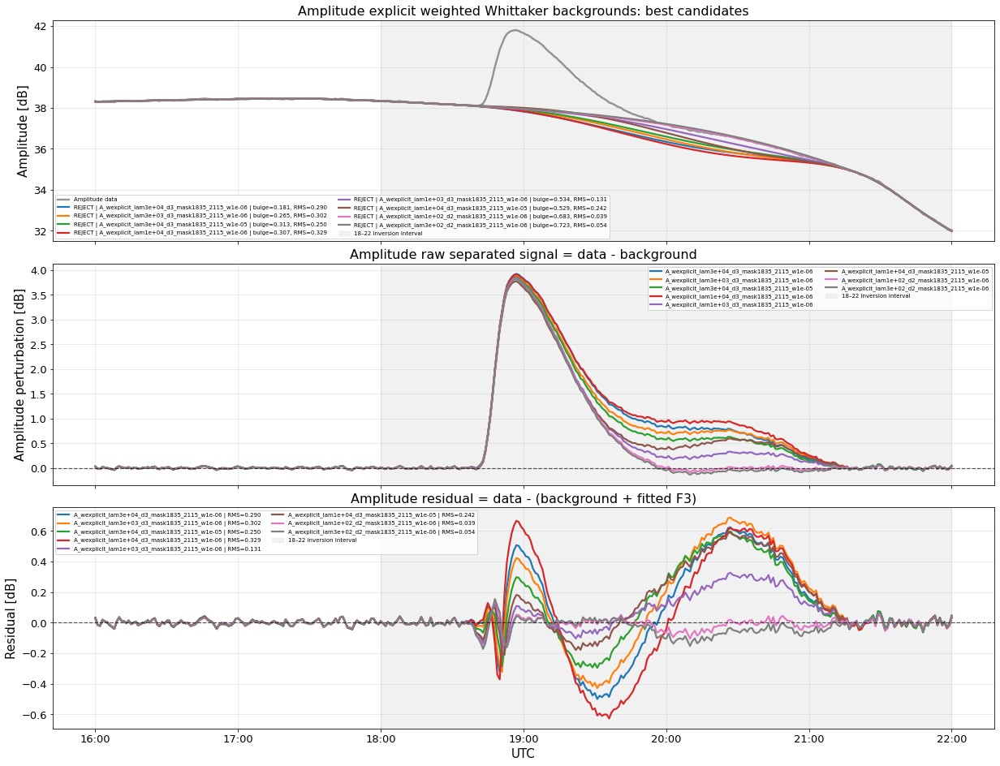

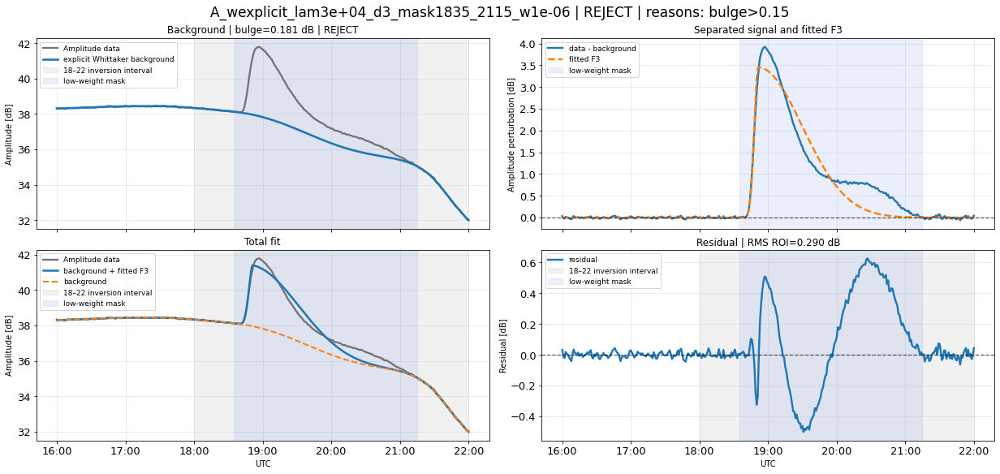

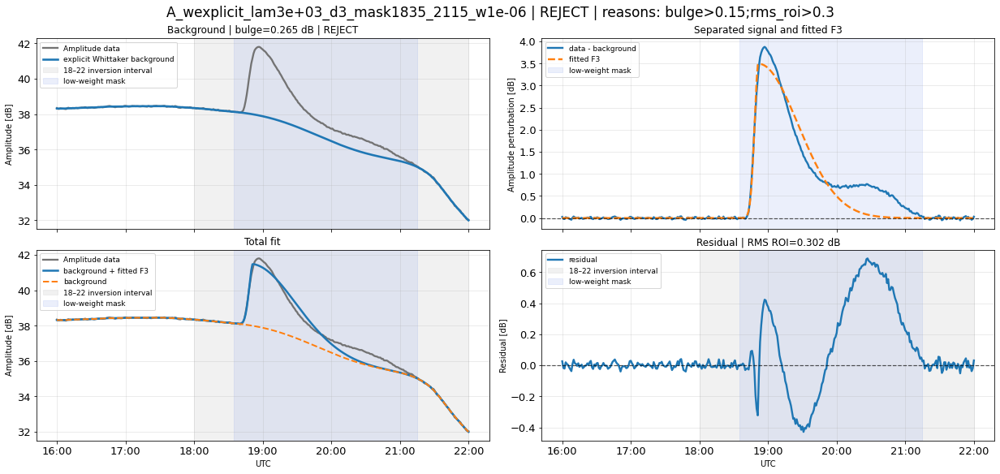

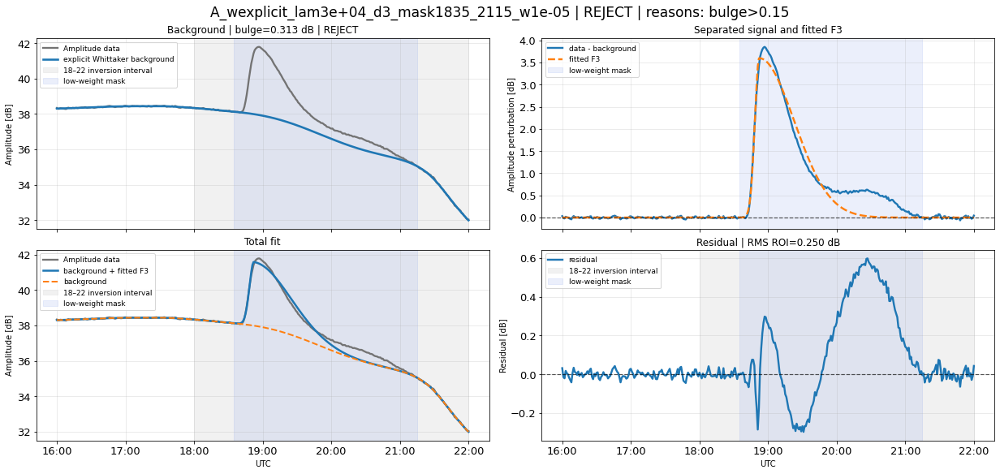

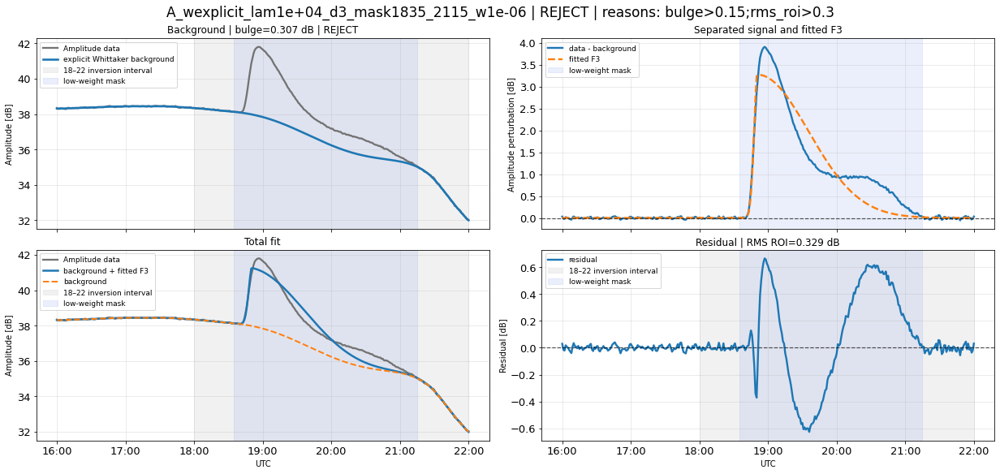

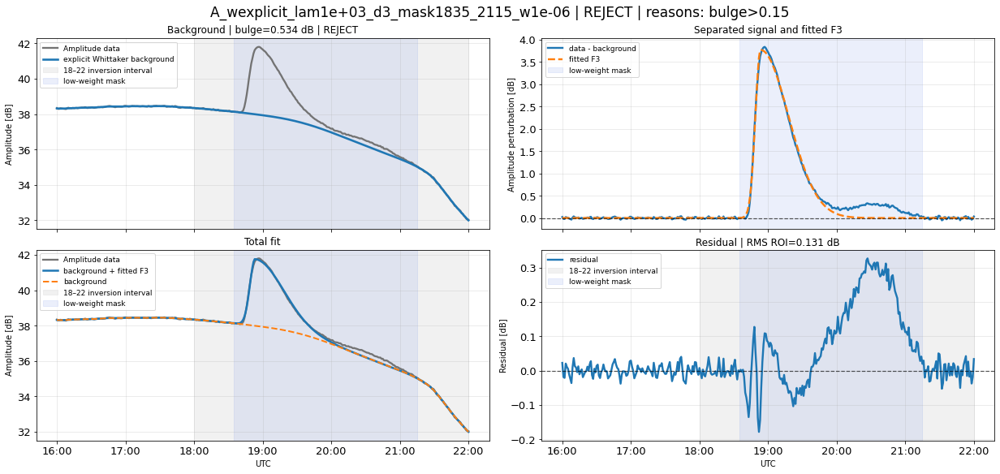

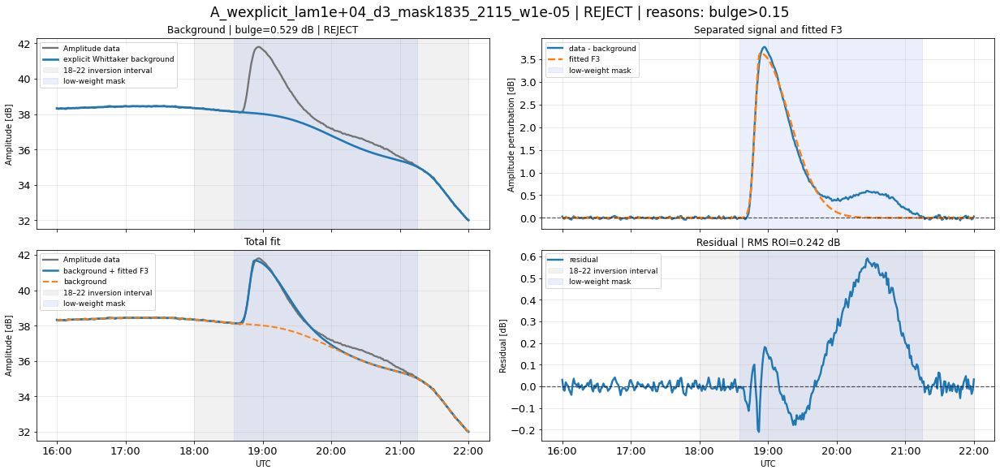

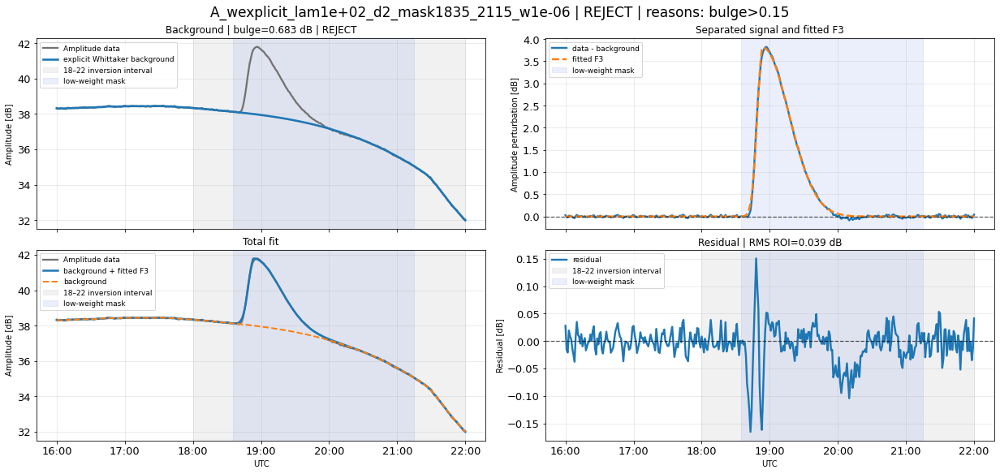

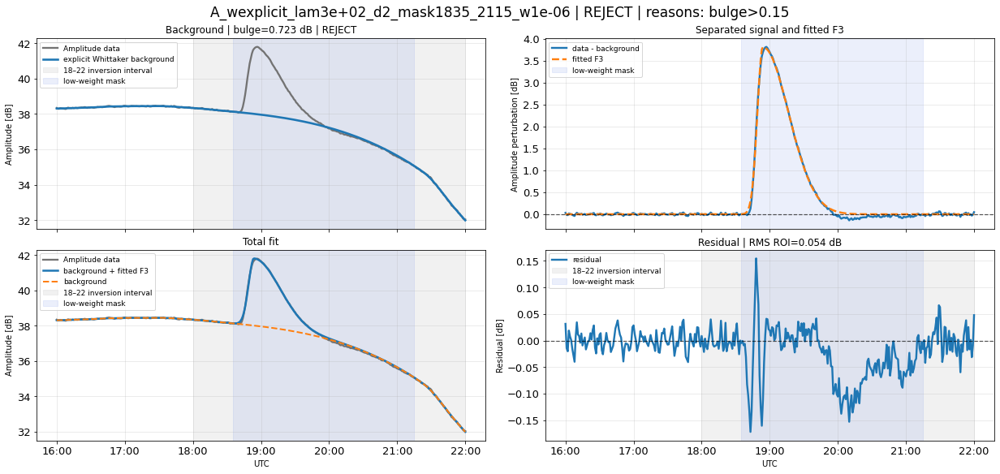

No PASS candidates found.
Least-bad candidate by score: A_wexplicit_lam3e+04_d3_mask1835_2115_w1e-06
Reasons: bulge>0.15
Figures saved in: /home/jp/basefolder_JP/amplitude_explicit_weighted_whittaker_tests
CSV saved in: amplitude_explicit_weighted_whittaker_tests/amplitude_explicit_weighted_whittaker_summary.csv
Candidates in: A_explicit_whittaker_candidates
Table in: A_explicit_whittaker_df


In [16]:
# ============================================================
# AMPLITUDE EXPLICIT WEIGHTED WHITTAKER TEST
#
# Model:
#   min_z sum_i w_i (A_i - z_i)^2 + lambda * ||D^m z||^2
#
# Meaning:
#   - high weight outside flare/recovery
#   - very low weight inside flare/recovery
#   - background is forced by quiet-time anchors
#
# No HDF5 export.
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from pathlib import Path
from math import comb
from scipy.sparse import diags
from scipy.sparse.linalg import spsolve
from scipy.optimize import least_squares

# ------------------------------------------------------------
# Output
# ------------------------------------------------------------
FIG_DIR_WEXP = Path("amplitude_explicit_weighted_whittaker_tests")
FIG_DIR_WEXP.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Plot style
# ------------------------------------------------------------
if "PLOT_STYLE" not in globals():
    PLOT_STYLE = {
        "fs_tick": 13,
        "fs_label": 15,
        "fs_title": 16,
        "fs_legend": 9,
        "alpha_grid": 0.30,
    }

if "date_fmt" not in globals():
    date_fmt = mdates.DateFormatter("%H:%M")

# ------------------------------------------------------------
# Data: amplitude, forced to 16:00–22:00
# ------------------------------------------------------------
if ("time_w" in globals()) and ("A_w" in globals()):
    time_A_raw = pd.to_datetime(time_w)
    A_raw = np.asarray(A_w, dtype=float)
elif ("time_utc" in globals()) and ("A_real" in globals()):
    time_A_raw = pd.to_datetime(time_utc)
    A_raw = np.asarray(A_real, dtype=float)
else:
    raise ValueError("No encuentro time_w/A_w ni time_utc/A_real.")

sort_idx = np.argsort(time_A_raw)
time_A_raw = pd.to_datetime(np.asarray(time_A_raw)[sort_idx])
A_raw = A_raw[sort_idx]

FULL_START = pd.Timestamp("2008-03-25 16:00:00")
FULL_END   = pd.Timestamp("2008-03-25 22:00:00")

full_mask = (time_A_raw >= FULL_START) & (time_A_raw <= FULL_END)

time_A = pd.to_datetime(time_A_raw[full_mask])
A_data = np.asarray(A_raw[full_mask], dtype=float)

if len(A_data) == 0:
    raise ValueError("La ventana 16:00–22:00 quedó vacía.")

t_hours_A = np.array((time_A - time_A[0]).total_seconds() / 3600.0, dtype=float)

# ------------------------------------------------------------
# Windows
# ------------------------------------------------------------
ROI_START_A = pd.Timestamp("2008-03-25 18:00:00")
ROI_END_A   = pd.Timestamp("2008-03-25 22:00:00")

MASK_START_VALUES = [
    pd.Timestamp("2008-03-25 18:35:00"),
]

MASK_END_VALUES = [
    pd.Timestamp("2008-03-25 21:15:00"),
    pd.Timestamp("2008-03-25 21:30:00"),
    pd.Timestamp("2008-03-25 21:45:00"),
]

roi_mask = (time_A >= ROI_START_A) & (time_A <= ROI_END_A)

# ------------------------------------------------------------
# F3 fitter, self-contained
# ------------------------------------------------------------
def _sigmoid_local(z):
    z = np.clip(z, -80, 80)
    return 1.0 / (1.0 + np.exp(-z))

def _f3_unit_local(t, t_pk, tau_u, tau_d, eps):
    tau_u = max(float(tau_u), 1e-8)
    tau_d = max(float(tau_d), 1e-8)
    eps   = max(float(eps),   1e-8)

    w = tau_u + (tau_d - tau_u) * _sigmoid_local((t - t_pk) / eps)
    y = np.exp(-0.5 * ((t - t_pk) / w) ** 2)

    ymax = np.nanmax(y)
    if ymax > 0:
        y = y / ymax

    return y

def _fit_f3_to_perturbation_local(time_array, y):
    time_array = pd.to_datetime(time_array)
    y = np.asarray(y, dtype=float)

    t = np.array((time_array - time_array[0]).total_seconds() / 3600.0, dtype=float)

    idx_pk = int(np.nanargmax(y))
    amp0 = max(float(y[idx_pk]), 1e-3)
    tpk0 = float(t[idx_pk])

    p0 = np.array([
        amp0,
        tpk0,
        0.08,
        0.70,
        0.05,
    ])

    lower = np.array([
        0.0,
        max(np.nanmin(t), tpk0 - 0.7),
        0.005,
        0.03,
        0.005,
    ])

    upper = np.array([
        max(2.0 * np.nanmax(y), 1.0),
        min(np.nanmax(t), tpk0 + 0.7),
        0.70,
        3.00,
        0.70,
    ])

    def residual_fun(p):
        amp, t_pk, tau_u, tau_d, eps = p
        return amp * _f3_unit_local(t, t_pk, tau_u, tau_d, eps) - y

    res = least_squares(
        residual_fun,
        p0,
        bounds=(lower, upper),
        max_nfev=50000,
        xtol=1e-10,
        ftol=1e-10,
        gtol=1e-10,
    )

    amp, t_pk, tau_u, tau_d, eps = res.x
    y_fit = amp * _f3_unit_local(t, t_pk, tau_u, tau_d, eps)

    return y_fit, {
        "amp": amp,
        "t_pk": t_pk,
        "tau_u": tau_u,
        "tau_d": tau_d,
        "eps": eps,
        "cost": res.cost,
        "success": res.success,
    }

# ------------------------------------------------------------
# Explicit weighted Whittaker solver
# ------------------------------------------------------------
def whittaker_explicit(y, weights, lam, diff_order=2):
    y = np.asarray(y, dtype=float)
    weights = np.asarray(weights, dtype=float)

    n = len(y)

    coeffs = np.array(
        [(-1)**k * comb(diff_order, k) for k in range(diff_order + 1)],
        dtype=float,
    )

    offsets = np.arange(diff_order + 1)

    D = diags(
        coeffs,
        offsets,
        shape=(n - diff_order, n),
        format="csr",
    )

    W = diags(weights, 0, shape=(n, n), format="csr")

    A = W + lam * (D.T @ D)
    b = weights * y

    z = spsolve(A, b)

    return np.asarray(z, dtype=float)

# ------------------------------------------------------------
# Candidate setup
# ------------------------------------------------------------
LAM_VALUES = [
    1e2,
    3e2,
    1e3,
    3e3,
    1e4,
    3e4,
]

DIFF_ORDER_VALUES = [
    2,
    3,
]

LOW_WEIGHT_VALUES = [
    1e-6,
    1e-5,
    1e-4,
    1e-3,
]

# Hard thresholds for diagnostics only
THRESH_BULGE_ABS_DB = 0.15
THRESH_RMS_ROI_DB = 0.30
THRESH_PRE_PERT_RMS_DB = 0.15
THRESH_POST_PERT_RMS_DB = 0.40
THRESH_PERT_MIN_DB = -0.20

A_explicit_whittaker_candidates = []

for mask_start in MASK_START_VALUES:
    for mask_end in MASK_END_VALUES:

        mask_bool = (time_A >= mask_start) & (time_A <= mask_end)
        pre_mask = time_A < mask_start
        post_mask = time_A > mask_end

        for lam in LAM_VALUES:
            for diff_order in DIFF_ORDER_VALUES:
                for low_weight in LOW_WEIGHT_VALUES:

                    weights = np.ones(len(time_A), dtype=float)
                    weights[mask_bool] = low_weight

                    bg = whittaker_explicit(
                        A_data,
                        weights=weights,
                        lam=lam,
                        diff_order=diff_order,
                    )

                    pert_raw = A_data - bg
                    pert_f3, f3_params = _fit_f3_to_perturbation_local(time_A, pert_raw)

                    total_fit = bg + pert_f3
                    residual = A_data - total_fit

                    # Bulge inside low-weight region relative to straight chord
                    t0 = (mask_start - time_A[0]).total_seconds() / 3600.0
                    t1 = (mask_end   - time_A[0]).total_seconds() / 3600.0

                    bg0 = np.interp(t0, t_hours_A, bg)
                    bg1 = np.interp(t1, t_hours_A, bg)

                    line_inside = np.interp(t_hours_A[mask_bool], [t0, t1], [bg0, bg1])
                    bg_minus_line = bg[mask_bool] - line_inside

                    bulge_pos = float(np.nanmax(bg_minus_line))
                    bulge_neg = float(np.nanmin(bg_minus_line))
                    bulge_abs = float(np.nanmax(np.abs(bg_minus_line)))

                    rms_resid_all = float(np.sqrt(np.nanmean(residual**2)))
                    rms_resid_roi = float(np.sqrt(np.nanmean(residual[roi_mask]**2)))
                    max_abs_resid_roi = float(np.nanmax(np.abs(residual[roi_mask])))

                    pre_pert_rms = float(np.sqrt(np.nanmean(pert_raw[pre_mask]**2))) if np.any(pre_mask) else np.nan
                    post_pert_rms = float(np.sqrt(np.nanmean(pert_raw[post_mask]**2))) if np.any(post_mask) else np.nan

                    pert_max = float(np.nanmax(pert_raw))
                    pert_min = float(np.nanmin(pert_raw))
                    pert_peak_time = time_A[int(np.nanargmax(pert_raw))]

                    reasons = []

                    if bulge_abs > THRESH_BULGE_ABS_DB:
                        reasons.append(f"bulge>{THRESH_BULGE_ABS_DB}")

                    if rms_resid_roi > THRESH_RMS_ROI_DB:
                        reasons.append(f"rms_roi>{THRESH_RMS_ROI_DB}")

                    if pre_pert_rms > THRESH_PRE_PERT_RMS_DB:
                        reasons.append(f"pre_rms>{THRESH_PRE_PERT_RMS_DB}")

                    if post_pert_rms > THRESH_POST_PERT_RMS_DB:
                        reasons.append(f"post_rms>{THRESH_POST_PERT_RMS_DB}")

                    if pert_min < THRESH_PERT_MIN_DB:
                        reasons.append(f"pert_min<{THRESH_PERT_MIN_DB}")

                    status = "PASS" if len(reasons) == 0 else "REJECT"

                    score = (
                        bulge_abs / THRESH_BULGE_ABS_DB
                        + rms_resid_roi / THRESH_RMS_ROI_DB
                        + pre_pert_rms / THRESH_PRE_PERT_RMS_DB
                        + post_pert_rms / THRESH_POST_PERT_RMS_DB
                        + max(0.0, -pert_min) / abs(THRESH_PERT_MIN_DB)
                    )

                    cid = (
                        f"A_wexplicit"
                        f"_lam{lam:.0e}"
                        f"_d{diff_order}"
                        f"_mask{mask_start.strftime('%H%M')}_{mask_end.strftime('%H%M')}"
                        f"_w{low_weight:.0e}"
                    )

                    A_explicit_whittaker_candidates.append({
                        "id": cid,
                        "status": status,
                        "reject_reasons": ";".join(reasons),
                        "method": "explicit_weighted_whittaker",
                        "lam": lam,
                        "diff_order": diff_order,
                        "mask_start": mask_start,
                        "mask_end": mask_end,
                        "low_weight": low_weight,
                        "background": bg,
                        "perturbation_raw": pert_raw,
                        "perturbation": pert_f3,
                        "f3_fit": pert_f3,
                        "total_fit": total_fit,
                        "residual": residual,
                        "f3_params": f3_params,
                        "bg_bulge_pos": bulge_pos,
                        "bg_bulge_neg": bulge_neg,
                        "bg_bulge_abs": bulge_abs,
                        "rms_residual_all": rms_resid_all,
                        "rms_residual_roi": rms_resid_roi,
                        "max_abs_residual_roi": max_abs_resid_roi,
                        "pre_flare_pert_rms": pre_pert_rms,
                        "post_mask_pert_rms": post_pert_rms,
                        "pert_max": pert_max,
                        "pert_min": pert_min,
                        "pert_peak_time": pert_peak_time,
                        "score": score,
                    })

# ------------------------------------------------------------
# Summary table
# ------------------------------------------------------------
A_explicit_whittaker_df = pd.DataFrame([
    {
        "status": c["status"],
        "id": c["id"],
        "reject_reasons": c["reject_reasons"],
        "method": c["method"],
        "lam": c["lam"],
        "diff_order": c["diff_order"],
        "mask_start": c["mask_start"].strftime("%H:%M"),
        "mask_end": c["mask_end"].strftime("%H:%M"),
        "low_weight": c["low_weight"],
        "bg_bulge_abs": c["bg_bulge_abs"],
        "bg_bulge_pos": c["bg_bulge_pos"],
        "bg_bulge_neg": c["bg_bulge_neg"],
        "rms_residual_roi": c["rms_residual_roi"],
        "max_abs_residual_roi": c["max_abs_residual_roi"],
        "pre_flare_pert_rms": c["pre_flare_pert_rms"],
        "post_mask_pert_rms": c["post_mask_pert_rms"],
        "pert_max": c["pert_max"],
        "pert_min": c["pert_min"],
        "pert_peak_time": c["pert_peak_time"],
        "F3_amp": c["f3_params"]["amp"],
        "F3_t_pk": c["f3_params"]["t_pk"],
        "F3_tau_u": c["f3_params"]["tau_u"],
        "F3_tau_d": c["f3_params"]["tau_d"],
        "F3_eps": c["f3_params"]["eps"],
        "score": c["score"],
    }
    for c in A_explicit_whittaker_candidates
])

A_explicit_whittaker_df = A_explicit_whittaker_df.sort_values(
    ["status", "bg_bulge_abs", "rms_residual_roi", "score"],
    ascending=[True, True, True, True],
).reset_index(drop=True)

display(A_explicit_whittaker_df)

A_explicit_whittaker_df.to_csv(
    FIG_DIR_WEXP / "amplitude_explicit_weighted_whittaker_summary.csv",
    index=False,
)

# ------------------------------------------------------------
# Best candidates
# ------------------------------------------------------------
pass_candidates = [c for c in A_explicit_whittaker_candidates if c["status"] == "PASS"]

if len(pass_candidates) > 0:
    candidates_to_plot = sorted(pass_candidates, key=lambda c: c["score"])[:8]
else:
    candidates_to_plot = sorted(A_explicit_whittaker_candidates, key=lambda c: c["score"])[:8]

# ------------------------------------------------------------
# Global plot: best candidates only
# ------------------------------------------------------------
fig, ax = plt.subplots(
    3, 1,
    figsize=(17, 13),
    sharex=True,
    constrained_layout=True,
    facecolor="white",
)

ax[0].plot(time_A, A_data, lw=2.4, color="0.45", alpha=0.75, label="Amplitude data")

for c in candidates_to_plot:
    label = (
        f"{c['status']} | {c['id']} | "
        f"bulge={c['bg_bulge_abs']:.3f}, RMS={c['rms_residual_roi']:.3f}"
    )
    ax[0].plot(time_A, c["background"], lw=2.2, label=label)

ax[0].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[0].set_title("Amplitude explicit weighted Whittaker backgrounds: best candidates", fontsize=PLOT_STYLE["fs_title"])
ax[0].set_ylabel("Amplitude [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0].legend(fontsize=7, frameon=True, ncol=2)

for c in candidates_to_plot:
    ax[1].plot(time_A, c["perturbation_raw"], lw=2.2, label=c["id"])

ax[1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[1].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[1].set_title("Amplitude raw separated signal = data - background", fontsize=PLOT_STYLE["fs_title"])
ax[1].set_ylabel("Amplitude perturbation [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1].legend(fontsize=7, frameon=True, ncol=2)

for c in candidates_to_plot:
    ax[2].plot(time_A, c["residual"], lw=2.2, label=f"{c['id']} | RMS={c['rms_residual_roi']:.3f}")

ax[2].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
ax[2].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
ax[2].set_title("Amplitude residual = data - (background + fitted F3)", fontsize=PLOT_STYLE["fs_title"])
ax[2].set_ylabel("Residual [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[2].set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])
ax[2].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[2].legend(fontsize=7, frameon=True, ncol=2)

for a in ax:
    a.xaxis.set_major_formatter(date_fmt)
    a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

fig.savefig(
    FIG_DIR_WEXP / "001_amplitude_explicit_weighted_whittaker_best_global.png",
    dpi=200,
    bbox_inches="tight",
)

plt.show()

# ------------------------------------------------------------
# Individual plots for best candidates
# ------------------------------------------------------------
for idx, c in enumerate(candidates_to_plot, start=1):

    fig, ax = plt.subplots(
        2, 2,
        figsize=(17, 8),
        sharex=True,
        constrained_layout=True,
        facecolor="white",
    )

    ax[0, 0].plot(time_A, A_data, lw=2.3, color="0.45", label="Amplitude data")
    ax[0, 0].plot(time_A, c["background"], lw=2.6, label="explicit Whittaker background")
    ax[0, 0].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[0, 0].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="low-weight mask")
    ax[0, 0].set_title(f"Background | bulge={c['bg_bulge_abs']:.3f} dB | {c['status']}")
    ax[0, 0].set_ylabel("Amplitude [dB]")
    ax[0, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[0, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    ax[0, 1].plot(time_A, c["perturbation_raw"], lw=2.4, label="data - background")
    ax[0, 1].plot(time_A, c["f3_fit"], lw=2.4, ls="--", label="fitted F3")
    ax[0, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
    ax[0, 1].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="low-weight mask")
    ax[0, 1].set_title("Separated signal and fitted F3")
    ax[0, 1].set_ylabel("Amplitude perturbation [dB]")
    ax[0, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[0, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    ax[1, 0].plot(time_A, A_data, lw=2.3, color="0.45", label="Amplitude data")
    ax[1, 0].plot(time_A, c["total_fit"], lw=2.5, label="background + fitted F3")
    ax[1, 0].plot(time_A, c["background"], lw=2.0, ls="--", label="background")
    ax[1, 0].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[1, 0].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="low-weight mask")
    ax[1, 0].set_title("Total fit")
    ax[1, 0].set_ylabel("Amplitude [dB]")
    ax[1, 0].set_xlabel("UTC")
    ax[1, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[1, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    ax[1, 1].plot(time_A, c["residual"], lw=2.4, label="residual")
    ax[1, 1].axhline(0.0, lw=1.2, ls="--", color="black", alpha=0.65)
    ax[1, 1].axvspan(ROI_START_A, ROI_END_A, color="0.85", alpha=0.35, label="18–22 inversion interval")
    ax[1, 1].axvspan(c["mask_start"], c["mask_end"], color="royalblue", alpha=0.10, label="low-weight mask")
    ax[1, 1].set_title(f"Residual | RMS ROI={c['rms_residual_roi']:.3f} dB")
    ax[1, 1].set_ylabel("Residual [dB]")
    ax[1, 1].set_xlabel("UTC")
    ax[1, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
    ax[1, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

    for a in ax.flat:
        a.xaxis.set_major_formatter(date_fmt)
        a.tick_params(labelsize=PLOT_STYLE["fs_tick"])

    fig.suptitle(
        f"{c['id']} | {c['status']} | reasons: {c['reject_reasons']}",
        fontsize=PLOT_STYLE["fs_title"] + 1,
    )

    fig.savefig(
        FIG_DIR_WEXP / f"amplitude_explicit_weighted_whittaker_candidate_{idx:02d}_{c['id']}.png",
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()

# ------------------------------------------------------------
# Print best
# ------------------------------------------------------------
if len(pass_candidates) > 0:
    A_explicit_suggested = sorted(pass_candidates, key=lambda c: c["score"])[0]
    print("Suggested PASS candidate:", A_explicit_suggested["id"])
else:
    A_explicit_suggested = sorted(A_explicit_whittaker_candidates, key=lambda c: c["score"])[0]
    print("No PASS candidates found.")
    print("Least-bad candidate by score:", A_explicit_suggested["id"])
    print("Reasons:", A_explicit_suggested["reject_reasons"])

print("Figures saved in:", FIG_DIR_WEXP.resolve())
print("CSV saved in:", FIG_DIR_WEXP / "amplitude_explicit_weighted_whittaker_summary.csv")
print("Candidates in: A_explicit_whittaker_candidates")
print("Table in: A_explicit_whittaker_df")

In [17]:
FIG_DIR_WEXP

PosixPath('amplitude_explicit_weighted_whittaker_tests')

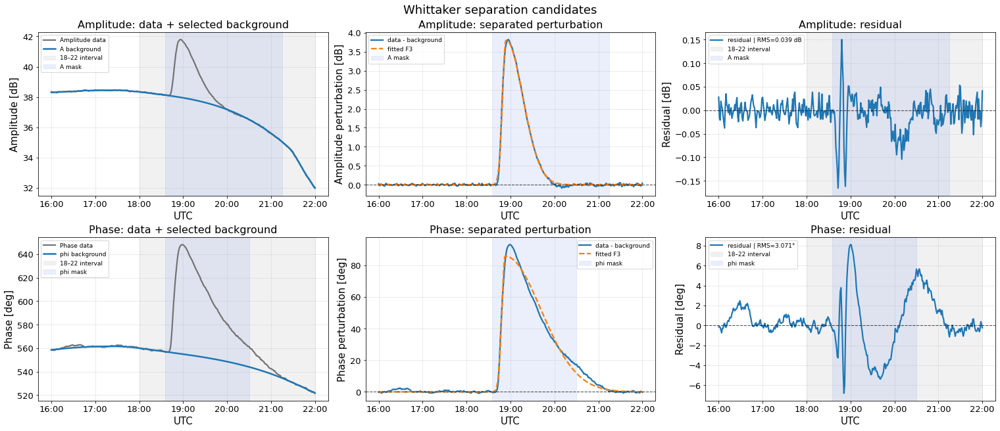

Selected A: A_wexplicit_lam1e+02_d2_mask1835_2115_w1e-06
Selected phi: phi_arpls_lam3e+04_d2_mask1835_2030_w0.02
A residual RMS ROI: 0.03948991298088215
phi residual RMS ROI: 3.07140805332529
A mask: 2008-03-25 18:35:00 to 2008-03-25 21:15:00
phi mask: 2008-03-25 18:35:00 to 2008-03-25 20:30:00


In [24]:
# ============================================================
# FINAL COMPARISON PANEL:
# Row 1: Amplitude selected candidate
# Row 2: Phase selected candidate
#
# Columns:
#   1) data + background
#   2) separated perturbation + fitted F3
#   3) residual = data - (background + fitted F3)
#
# No HDF5 export.
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from pathlib import Path

# ------------------------------------------------------------
# Selected candidate IDs
# ------------------------------------------------------------
#SELECT_ID_A = "A_wexplicit_lam1e+02_d2_mask1835_2115_w1e-06"
SELECT_ID_A = "A_wexplicit_lam1e+02_d2_mask1835_2115_w1e-06"
SELECT_ID_PHI = "phi_arpls_lam3e+04_d2_mask1835_2030_w0.02"

# ------------------------------------------------------------
# Collect available candidate pools
# ------------------------------------------------------------
A_pools = []
for name in [
    "A_explicit_whittaker_candidates",
    "A_whittaker_candidates_v2",
    "A_whittaker_candidates",
    "A_candidates",
]:
    if name in globals():
        A_pools.extend(globals()[name])

phi_pools = []
for name in [
    "phi_candidates",
    "PHI_candidates",
    "phase_arpls_candidates",
    "phase_mask_candidates",
]:
    if name in globals():
        phi_pools.extend(globals()[name])

A_sel = next((c for c in A_pools if c["id"] == SELECT_ID_A), None)
phi_sel = next((c for c in phi_pools if c["id"] == SELECT_ID_PHI), None)

if A_sel is None:
    raise ValueError(
        f"No encontré SELECT_ID_A={SELECT_ID_A}\n"
        f"Opciones A disponibles:\n{[c['id'] for c in A_pools]}"
    )

if phi_sel is None:
    raise ValueError(
        f"No encontré SELECT_ID_PHI={SELECT_ID_PHI}\n"
        f"Opciones phi disponibles:\n{[c['id'] for c in phi_pools]}"
    )

# ------------------------------------------------------------
# Data arrays
# ------------------------------------------------------------
if "time_A" not in globals() or "A_data" not in globals():
    raise ValueError("No encuentro time_A y A_data. Corre primero la celda de amplitud explícita.")

if "time_phase" in globals() and "phi_data" in globals():
    time_phi = pd.to_datetime(time_phase)
    phi_data_plot = np.asarray(phi_data, dtype=float)
elif "time_utc" in globals() and "phi_real" in globals():
    time_phi = pd.to_datetime(time_utc)
    phi_data_plot = np.asarray(phi_real, dtype=float)
else:
    raise ValueError("No encuentro time_phase/phi_data ni time_utc/phi_real.")

time_A_plot = pd.to_datetime(time_A)
A_data_plot = np.asarray(A_data, dtype=float)

# ------------------------------------------------------------
# Style
# ------------------------------------------------------------
if "PLOT_STYLE" not in globals():
    PLOT_STYLE = {
        "fs_tick": 13,
        "fs_label": 15,
        "fs_title": 16,
        "fs_legend": 9,
        "alpha_grid": 0.30,
    }

date_fmt = mdates.DateFormatter("%H:%M")

ROI_START = pd.Timestamp("2008-03-25 18:00:00")
ROI_END   = pd.Timestamp("2008-03-25 22:00:00")

# ------------------------------------------------------------
# Candidate arrays
# ------------------------------------------------------------
A_bg = np.asarray(A_sel["background"], dtype=float)
A_pert_raw = np.asarray(A_sel["perturbation_raw"], dtype=float)
A_f3 = np.asarray(A_sel["f3_fit"], dtype=float)
A_total = np.asarray(A_sel["total_fit"], dtype=float)
A_res = np.asarray(A_sel["residual"], dtype=float)

phi_bg = np.asarray(phi_sel["background"], dtype=float)

if "perturbation_raw" in phi_sel:
    phi_pert_raw = np.asarray(phi_sel["perturbation_raw"], dtype=float)
else:
    phi_pert_raw = phi_data_plot - phi_bg

if "f3_fit" in phi_sel:
    phi_f3 = np.asarray(phi_sel["f3_fit"], dtype=float)
elif "perturbation" in phi_sel:
    phi_f3 = np.asarray(phi_sel["perturbation"], dtype=float)
else:
    raise ValueError("El candidato de fase no tiene f3_fit ni perturbation.")

if "total_fit" in phi_sel:
    phi_total = np.asarray(phi_sel["total_fit"], dtype=float)
else:
    phi_total = phi_bg + phi_f3

if "residual" in phi_sel:
    phi_res = np.asarray(phi_sel["residual"], dtype=float)
else:
    phi_res = phi_data_plot - phi_total

A_rms = np.sqrt(np.nanmean(A_res[(time_A_plot >= ROI_START) & (time_A_plot <= ROI_END)]**2))
phi_rms = np.sqrt(np.nanmean(phi_res[(time_phi >= ROI_START) & (time_phi <= ROI_END)]**2))

# ------------------------------------------------------------
# Masks used by selected candidates
# ------------------------------------------------------------
A_mask_start = A_sel.get("mask_start", pd.Timestamp("2008-03-25 18:35:00"))
A_mask_end   = A_sel.get("mask_end",   pd.Timestamp("2008-03-25 21:15:00"))

phi_mask_start = phi_sel.get("mask_start", pd.Timestamp("2008-03-25 18:35:00"))
phi_mask_end   = phi_sel.get("mask_end",   pd.Timestamp("2008-03-25 20:30:00"))

A_mask_start = pd.Timestamp(A_mask_start)
A_mask_end   = pd.Timestamp(A_mask_end)
phi_mask_start = pd.Timestamp(phi_mask_start)
phi_mask_end   = pd.Timestamp(phi_mask_end)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------
fig, ax = plt.subplots(
    2, 3,
    figsize=(21, 9),
    sharex=False,
    constrained_layout=True,
    facecolor="white",
)

# ============================================================
# Row 1: Amplitude
# ============================================================
ax[0, 0].plot(time_A_plot, A_data_plot, lw=2.2, color="0.45", label="Amplitude data")
ax[0, 0].plot(time_A_plot, A_bg, lw=2.5, label="A background")
ax[0, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 interval")
ax[0, 0].axvspan(A_mask_start, A_mask_end, color="royalblue", alpha=0.10, label="A mask")
ax[0, 0].set_title("Amplitude: data + selected background", fontsize=PLOT_STYLE["fs_title"])
ax[0, 0].set_ylabel("Amplitude [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

ax[0, 1].plot(time_A_plot, A_pert_raw, lw=2.3, label="data - background")
ax[0, 1].plot(time_A_plot, A_f3, lw=2.3, ls="--", label="fitted F3")
ax[0, 1].axhline(0.0, lw=1.1, ls="--", color="black", alpha=0.65)
ax[0, 1].axvspan(A_mask_start, A_mask_end, color="royalblue", alpha=0.10, label="A mask")
ax[0, 1].set_title("Amplitude: separated perturbation", fontsize=PLOT_STYLE["fs_title"])
ax[0, 1].set_ylabel("Amplitude perturbation [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

ax[0, 2].plot(time_A_plot, A_res, lw=2.2, label=f"residual | RMS={A_rms:.3f} dB")
ax[0, 2].axhline(0.0, lw=1.1, ls="--", color="black", alpha=0.65)
ax[0, 2].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 interval")
ax[0, 2].axvspan(A_mask_start, A_mask_end, color="royalblue", alpha=0.10, label="A mask")
ax[0, 2].set_title("Amplitude: residual", fontsize=PLOT_STYLE["fs_title"])
ax[0, 2].set_ylabel("Residual [dB]", fontsize=PLOT_STYLE["fs_label"])
ax[0, 2].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[0, 2].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

# ============================================================
# Row 2: Phase
# ============================================================
ax[1, 0].plot(time_phi, phi_data_plot, lw=2.2, color="0.45", label="Phase data")
ax[1, 0].plot(time_phi, phi_bg, lw=2.5, label="phi background")
ax[1, 0].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 interval")
ax[1, 0].axvspan(phi_mask_start, phi_mask_end, color="royalblue", alpha=0.10, label="phi mask")
ax[1, 0].set_title("Phase: data + selected background", fontsize=PLOT_STYLE["fs_title"])
ax[1, 0].set_ylabel("Phase [deg]", fontsize=PLOT_STYLE["fs_label"])
ax[1, 0].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1, 0].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

ax[1, 1].plot(time_phi, phi_pert_raw, lw=2.3, label="data - background")
ax[1, 1].plot(time_phi, phi_f3, lw=2.3, ls="--", label="fitted F3")
ax[1, 1].axhline(0.0, lw=1.1, ls="--", color="black", alpha=0.65)
ax[1, 1].axvspan(phi_mask_start, phi_mask_end, color="royalblue", alpha=0.10, label="phi mask")
ax[1, 1].set_title("Phase: separated perturbation", fontsize=PLOT_STYLE["fs_title"])
ax[1, 1].set_ylabel("Phase perturbation [deg]", fontsize=PLOT_STYLE["fs_label"])
ax[1, 1].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1, 1].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

ax[1, 2].plot(time_phi, phi_res, lw=2.2, label=f"residual | RMS={phi_rms:.3f}°")
ax[1, 2].axhline(0.0, lw=1.1, ls="--", color="black", alpha=0.65)
ax[1, 2].axvspan(ROI_START, ROI_END, color="0.85", alpha=0.35, label="18–22 interval")
ax[1, 2].axvspan(phi_mask_start, phi_mask_end, color="royalblue", alpha=0.10, label="phi mask")
ax[1, 2].set_title("Phase: residual", fontsize=PLOT_STYLE["fs_title"])
ax[1, 2].set_ylabel("Residual [deg]", fontsize=PLOT_STYLE["fs_label"])
ax[1, 2].grid(True, alpha=PLOT_STYLE["alpha_grid"])
ax[1, 2].legend(fontsize=PLOT_STYLE["fs_legend"], frameon=True)

for a in ax.flat:
    a.xaxis.set_major_formatter(date_fmt)
    a.tick_params(labelsize=PLOT_STYLE["fs_tick"])
    a.set_xlabel("UTC", fontsize=PLOT_STYLE["fs_label"])

#fig.suptitle(
#    f"Selected Whittaker-only candidates\nA={SELECT_ID_A} | phi={SELECT_ID_PHI}",
#    fontsize=PLOT_STYLE["fs_title"] + 2,
#)

fig.suptitle("Whittaker separation candidates",fontsize=PLOT_STYLE["fs_title"] + 2)

plt.show()

print("Selected A:", SELECT_ID_A)
print("Selected phi:", SELECT_ID_PHI)
print("A residual RMS ROI:", A_rms)
print("phi residual RMS ROI:", phi_rms)
print("A mask:", A_mask_start, "to", A_mask_end)
print("phi mask:", phi_mask_start, "to", phi_mask_end)

In [22]:
# ============================================================
# EXPORT SELECTED WHITTAKER-ONLY SEPARATION TO HDF5
#
# Saves:
#   A selected background/perturbation
#   phi selected background/perturbation
#   full 16:00–22:00 arrays
#   inversion mask for 18:00–22:00
#
# Uses current selected candidates:
#   SELECT_ID_A
#   SELECT_ID_PHI
# ============================================================

import numpy as np
import pandas as pd
import h5py
from pathlib import Path

# ------------------------------------------------------------
# Output file
# ------------------------------------------------------------
OUT_H5 = Path("real_whittaker_selected_background_16_22_for_inversion.h5")


#SELECT_ID_A = "A_wexplicit_lam1e+02_d2_mask1835_2115_w1e-06"
#SELECT_ID_PHI = "phi_arpls_lam3e+04_d2_mask1835_2030_w0.02"
# ------------------------------------------------------------
# Required selected IDs
# ------------------------------------------------------------
SELECT_ID_A = "A_wexplicit_lam1e+02_d2_mask1835_2115_w1e-06"
SELECT_ID_PHI = "phi_arpls_lam3e+04_d2_mask1835_2030_w0.02"

# ------------------------------------------------------------
# Find selected candidates
# ------------------------------------------------------------
A_pools = []
for name in [
    "A_explicit_whittaker_candidates",
    "A_whittaker_candidates_v2",
    "A_whittaker_candidates",
    "A_candidates",
]:
    if name in globals():
        A_pools.extend(globals()[name])

phi_pools = []
for name in [
    "phi_candidates",
    "PHI_candidates",
    "phase_arpls_candidates",
    "phase_mask_candidates",
]:
    if name in globals():
        phi_pools.extend(globals()[name])

A_sel = next((c for c in A_pools if c["id"] == SELECT_ID_A), None)
phi_sel = next((c for c in phi_pools if c["id"] == SELECT_ID_PHI), None)

if A_sel is None:
    raise ValueError(
        f"No encontré SELECT_ID_A={SELECT_ID_A}\n"
        f"Opciones A disponibles:\n{[c['id'] for c in A_pools]}"
    )

if phi_sel is None:
    raise ValueError(
        f"No encontré SELECT_ID_PHI={SELECT_ID_PHI}\n"
        f"Opciones phi disponibles:\n{[c['id'] for c in phi_pools]}"
    )

# ------------------------------------------------------------
# Time and data arrays
# ------------------------------------------------------------
if "time_A" not in globals() or "A_data" not in globals():
    raise ValueError("No encuentro time_A y A_data.")

time_utc = pd.to_datetime(time_A)
A_real = np.asarray(A_data, dtype=float)

if "time_phase" in globals() and "phi_data" in globals():
    time_phi = pd.to_datetime(time_phase)
    phi_real_full = np.asarray(phi_data, dtype=float)
elif "time_utc" in globals() and "phi_real" in globals():
    time_phi = pd.to_datetime(globals()["time_utc"])
    phi_real_full = np.asarray(phi_real, dtype=float)
else:
    raise ValueError("No encuentro time_phase/phi_data ni time_utc/phi_real.")

# ------------------------------------------------------------
# Align phase to amplitude time axis if needed
# ------------------------------------------------------------
if len(time_phi) != len(time_utc) or np.any(pd.to_datetime(time_phi).to_numpy() != time_utc.to_numpy()):
    phi_series = pd.Series(phi_real_full, index=pd.to_datetime(time_phi)).sort_index()
    phi_real = phi_series.reindex(time_utc).interpolate("time").to_numpy(dtype=float)
else:
    phi_real = np.asarray(phi_real_full, dtype=float)

# ------------------------------------------------------------
# Selected A arrays
# ------------------------------------------------------------
A_background = np.asarray(A_sel["background"], dtype=float)

if "perturbation_raw" in A_sel:
    A_perturbation_raw = np.asarray(A_sel["perturbation_raw"], dtype=float)
else:
    A_perturbation_raw = A_real - A_background

if "f3_fit" in A_sel:
    A_perturbation = np.asarray(A_sel["f3_fit"], dtype=float)
elif "perturbation" in A_sel:
    A_perturbation = np.asarray(A_sel["perturbation"], dtype=float)
else:
    raise ValueError("A_sel no tiene f3_fit ni perturbation.")

if "total_fit" in A_sel:
    A_total_fit = np.asarray(A_sel["total_fit"], dtype=float)
else:
    A_total_fit = A_background + A_perturbation

if "residual" in A_sel:
    A_residual = np.asarray(A_sel["residual"], dtype=float)
else:
    A_residual = A_real - A_total_fit

# ------------------------------------------------------------
# Selected phi arrays
# ------------------------------------------------------------
phi_background = np.asarray(phi_sel["background"], dtype=float)

if len(phi_background) != len(time_utc):
    phi_bg_series = pd.Series(phi_background, index=pd.to_datetime(time_phi)).sort_index()
    phi_background = phi_bg_series.reindex(time_utc).interpolate("time").to_numpy(dtype=float)

if "perturbation_raw" in phi_sel:
    phi_perturbation_raw = np.asarray(phi_sel["perturbation_raw"], dtype=float)
    if len(phi_perturbation_raw) != len(time_utc):
        phi_pr_series = pd.Series(phi_perturbation_raw, index=pd.to_datetime(time_phi)).sort_index()
        phi_perturbation_raw = phi_pr_series.reindex(time_utc).interpolate("time").to_numpy(dtype=float)
else:
    phi_perturbation_raw = phi_real - phi_background

if "f3_fit" in phi_sel:
    phi_perturbation = np.asarray(phi_sel["f3_fit"], dtype=float)
elif "perturbation" in phi_sel:
    phi_perturbation = np.asarray(phi_sel["perturbation"], dtype=float)
else:
    raise ValueError("phi_sel no tiene f3_fit ni perturbation.")

if len(phi_perturbation) != len(time_utc):
    phi_p_series = pd.Series(phi_perturbation, index=pd.to_datetime(time_phi)).sort_index()
    phi_perturbation = phi_p_series.reindex(time_utc).interpolate("time").to_numpy(dtype=float)

if "total_fit" in phi_sel:
    phi_total_fit = np.asarray(phi_sel["total_fit"], dtype=float)
    if len(phi_total_fit) != len(time_utc):
        phi_tf_series = pd.Series(phi_total_fit, index=pd.to_datetime(time_phi)).sort_index()
        phi_total_fit = phi_tf_series.reindex(time_utc).interpolate("time").to_numpy(dtype=float)
else:
    phi_total_fit = phi_background + phi_perturbation

if "residual" in phi_sel:
    phi_residual = np.asarray(phi_sel["residual"], dtype=float)
    if len(phi_residual) != len(time_utc):
        phi_r_series = pd.Series(phi_residual, index=pd.to_datetime(time_phi)).sort_index()
        phi_residual = phi_r_series.reindex(time_utc).interpolate("time").to_numpy(dtype=float)
else:
    phi_residual = phi_real - phi_total_fit

# ------------------------------------------------------------
# Time arrays and masks
# ------------------------------------------------------------
t0 = time_utc[0]
t_hours = np.array((time_utc - t0).total_seconds() / 3600.0, dtype=float)
timestamps_unix = np.array(time_utc.astype("int64") // 10**9, dtype=np.int64)
timestamps_iso = np.array([ts.isoformat() for ts in time_utc], dtype=object)

INV_START = pd.Timestamp("2008-03-25 18:00:00")
INV_END   = pd.Timestamp("2008-03-25 22:00:00")

inversion_mask_18_22 = np.asarray(
    (time_utc >= INV_START) & (time_utc <= INV_END),
    dtype=bool,
)

A_mask_start = pd.Timestamp(A_sel.get("mask_start", "2008-03-25 18:35:00"))
A_mask_end   = pd.Timestamp(A_sel.get("mask_end",   "2008-03-25 21:15:00"))

phi_mask_start = pd.Timestamp(phi_sel.get("mask_start", "2008-03-25 18:35:00"))
phi_mask_end   = pd.Timestamp(phi_sel.get("mask_end",   "2008-03-25 20:30:00"))

A_mask = np.asarray((time_utc >= A_mask_start) & (time_utc <= A_mask_end), dtype=bool)
phi_mask = np.asarray((time_utc >= phi_mask_start) & (time_utc <= phi_mask_end), dtype=bool)

# Compatibility name used by previous separation files
phi_quiet_mask = ~phi_mask

# ------------------------------------------------------------
# Metrics
# ------------------------------------------------------------
A_rms_roi = float(np.sqrt(np.nanmean(A_residual[inversion_mask_18_22] ** 2)))
phi_rms_roi = float(np.sqrt(np.nanmean(phi_residual[inversion_mask_18_22] ** 2)))

A_raw_rms_roi = float(np.sqrt(np.nanmean(A_perturbation_raw[inversion_mask_18_22] ** 2)))
phi_raw_rms_roi = float(np.sqrt(np.nanmean(phi_perturbation_raw[inversion_mask_18_22] ** 2)))

# ------------------------------------------------------------
# Write HDF5
# ------------------------------------------------------------
str_dtype = h5py.string_dtype(encoding="utf-8")

with h5py.File(OUT_H5, "w") as f:

    # Root-level datasets compatible with current inversion loaders
    f.create_dataset("timestamps_iso", data=timestamps_iso, dtype=str_dtype)
    f.create_dataset("timestamps_unix", data=timestamps_unix)
    f.create_dataset("t_hours", data=t_hours)

    f.create_dataset("A_real", data=A_real)
    f.create_dataset("phi_real", data=phi_real)

    f.create_dataset("A_background", data=A_background)
    f.create_dataset("A_perturbation_raw", data=A_perturbation_raw)
    f.create_dataset("A_perturbation", data=A_perturbation)
    f.create_dataset("A_total_fit", data=A_total_fit)
    f.create_dataset("A_residual", data=A_residual)
    f.create_dataset("A_residual_after_background", data=A_perturbation_raw)

    f.create_dataset("phi_background", data=phi_background)
    f.create_dataset("phi_perturbation_raw", data=phi_perturbation_raw)
    f.create_dataset("phi_perturbation", data=phi_perturbation)
    f.create_dataset("phi_total_fit", data=phi_total_fit)
    f.create_dataset("phi_residual", data=phi_residual)
    f.create_dataset("phi_residual_after_background", data=phi_perturbation_raw)

    f.create_dataset("phi_quiet_mask", data=phi_quiet_mask.astype(bool))

    # Masks
    g_masks = f.create_group("masks")
    g_masks.create_dataset("inversion_mask_18_22", data=inversion_mask_18_22.astype(bool))
    g_masks.create_dataset("A_mask", data=A_mask.astype(bool))
    g_masks.create_dataset("phi_mask", data=phi_mask.astype(bool))

    g_masks.attrs["inversion_start"] = INV_START.isoformat()
    g_masks.attrs["inversion_end"] = INV_END.isoformat()
    g_masks.attrs["A_mask_start"] = A_mask_start.isoformat()
    g_masks.attrs["A_mask_end"] = A_mask_end.isoformat()
    g_masks.attrs["phi_mask_start"] = phi_mask_start.isoformat()
    g_masks.attrs["phi_mask_end"] = phi_mask_end.isoformat()

    # Selected candidate metadata
    g_sel = f.create_group("selected")
    g_sel.attrs["A_candidate_id"] = SELECT_ID_A
    g_sel.attrs["phi_candidate_id"] = SELECT_ID_PHI
    g_sel.attrs["description"] = "Selected Whittaker-only background separation for real-data inversion."

    # A params
    gA = f.create_group("params_A")
    gA.attrs["candidate_id"] = SELECT_ID_A
    gA.attrs["method"] = str(A_sel.get("method", "unknown"))
    gA.attrs["lam"] = float(A_sel.get("lam", np.nan))
    gA.attrs["diff_order"] = float(A_sel.get("diff_order", np.nan))
    gA.attrs["low_weight"] = float(A_sel.get("low_weight", np.nan))
    gA.attrs["mask_start"] = A_mask_start.isoformat()
    gA.attrs["mask_end"] = A_mask_end.isoformat()

    for k, v in A_sel.get("f3_params", {}).items():
        if isinstance(v, (int, float, np.integer, np.floating, bool, np.bool_)):
            gA.attrs[f"F3_{k}"] = float(v)

    # Placeholder for compatibility with old code expecting coeffs_background
    gA.create_dataset("coeffs_background", data=np.array([], dtype=float))

    # Phi params
    gP = f.create_group("params_phi")
    gP.attrs["candidate_id"] = SELECT_ID_PHI
    gP.attrs["method"] = str(phi_sel.get("method", "unknown"))
    gP.attrs["lam"] = float(phi_sel.get("lam", np.nan))
    gP.attrs["diff_order"] = float(phi_sel.get("diff_order", np.nan))
    gP.attrs["mask_start"] = phi_mask_start.isoformat()
    gP.attrs["mask_end"] = phi_mask_end.isoformat()

    if "p" in phi_sel and phi_sel["p"] is not None:
        gP.attrs["p"] = float(phi_sel["p"])

    if "flare_weight" in phi_sel and phi_sel["flare_weight"] is not None:
        gP.attrs["flare_weight"] = float(phi_sel["flare_weight"])

    for k, v in phi_sel.get("f3_params", {}).items():
        if isinstance(v, (int, float, np.integer, np.floating, bool, np.bool_)):
            gP.attrs[f"F3_{k}"] = float(v)

    # Placeholder for compatibility with old code expecting coeffs_background
    gP.create_dataset("coeffs_background", data=np.array([], dtype=float))

    # Metrics
    gm = f.create_group("selected_metrics")
    gm.attrs["A_rms_residual_roi"] = A_rms_roi
    gm.attrs["phi_rms_residual_roi"] = phi_rms_roi
    gm.attrs["A_raw_perturbation_rms_roi"] = A_raw_rms_roi
    gm.attrs["phi_raw_perturbation_rms_roi"] = phi_raw_rms_roi

    for key in [
        "bg_bulge_abs",
        "bg_bulge_pos",
        "bg_bulge_neg",
        "rms_residual_roi",
        "max_abs_residual_roi",
        "pre_flare_pert_rms",
        "post_mask_pert_rms",
        "pert_max",
        "pert_min",
    ]:
        if key in A_sel:
            gm.attrs[f"A_{key}"] = float(A_sel[key])
        if key in phi_sel:
            gm.attrs[f"phi_{key}"] = float(phi_sel[key])

# ------------------------------------------------------------
# Verify file
# ------------------------------------------------------------
print("Archivo guardado:", OUT_H5.resolve())
print("Selected A:", SELECT_ID_A)
print("Selected phi:", SELECT_ID_PHI)
print("n samples:", len(time_utc))
print("time range:", time_utc[0], "to", time_utc[-1])
print("A residual RMS ROI:", A_rms_roi)
print("phi residual RMS ROI:", phi_rms_roi)
print("A mask:", A_mask_start, "to", A_mask_end)
print("phi mask:", phi_mask_start, "to", phi_mask_end)

print("\nHDF5 contents:")
with h5py.File(OUT_H5, "r") as f:
    def visitor(name, obj):
        if isinstance(obj, h5py.Dataset):
            print("DATASET", name, obj.shape, obj.dtype)
        elif isinstance(obj, h5py.Group):
            print("GROUP  ", name)

    f.visititems(visitor)

Archivo guardado: /home/jp/basefolder_JP/real_whittaker_selected_background_16_22_for_inversion.h5
Selected A: A_wexplicit_lam1e+02_d2_mask1835_2115_w1e-06
Selected phi: phi_arpls_lam3e+04_d2_mask1835_2030_w0.02
n samples: 361
time range: 2008-03-25 16:00:00 to 2008-03-25 22:00:00
A residual RMS ROI: 0.03948991298088215
phi residual RMS ROI: 3.07140805332529
A mask: 2008-03-25 18:35:00 to 2008-03-25 21:15:00
phi mask: 2008-03-25 18:35:00 to 2008-03-25 20:30:00

HDF5 contents:
DATASET A_background (361,) float64
DATASET A_perturbation (361,) float64
DATASET A_perturbation_raw (361,) float64
DATASET A_real (361,) float64
DATASET A_residual (361,) float64
DATASET A_residual_after_background (361,) float64
DATASET A_total_fit (361,) float64
GROUP   masks
DATASET masks/A_mask (361,) bool
DATASET masks/inversion_mask_18_22 (361,) bool
DATASET masks/phi_mask (361,) bool
GROUP   params_A
DATASET params_A/coeffs_background (0,) float64
GROUP   params_phi
DATASET params_phi/coeffs_background (0,

In [9]:
# ============================================================
# OPTIONAL EXPORT SELECTED HDF5
# ============================================================
# Export queda apagado por defecto en la configuración.

if EXPORT_SELECTED:
    def write_string_array(values):
        return np.asarray([str(v).encode("utf-8") for v in values])

    with h5py.File(OUTPUT_H5, "w") as f:
        f.attrs["date"] = DATE
        f.attrs["method"] = "Whittaker-only locked separation; selected manually"
        f.attrs["selected_A_id"] = SELECT_ID_A
        f.attrs["selected_phi_id"] = SELECT_ID_PHI
        f.attrs["T_START"] = str(T_START)
        f.attrs["T_END"] = str(T_END)
        f.attrs["ROI_START"] = str(ROI_START)
        f.attrs["ROI_END"] = str(ROI_END)
        f.attrs["RESAMPLE_RULE"] = str(RESAMPLE_RULE)
        f.attrs["RESAMPLE_AGG"] = str(RESAMPLE_AGG)

        f.create_dataset("timestamps_iso", data=write_string_array(time_utc.astype(str)))
        f.create_dataset("timestamps", data=np.asarray(time_utc.astype("int64") // 10**9, dtype=np.int64))
        f.create_dataset("t_hours", data=t_hours)

        f.create_dataset("A_real", data=A_real)
        f.create_dataset("phi_real", data=phi_real)

        f.create_dataset("A_background", data=A_sel["background"])
        f.create_dataset("A_perturbation", data=A_sel["perturbation"])
        f.create_dataset("A_perturbation_raw", data=A_sel["perturbation_raw"])
        f.create_dataset("A_total_fit", data=A_sel["total_fit"])
        f.create_dataset("A_residual", data=A_sel["residual"])

        f.create_dataset("phi_background", data=phi_sel["background"])
        f.create_dataset("phi_perturbation", data=phi_sel["perturbation"])
        f.create_dataset("phi_perturbation_raw", data=phi_sel["perturbation_raw"])
        f.create_dataset("phi_total_fit", data=phi_sel["total_fit"])
        f.create_dataset("phi_residual", data=phi_sel["residual"])

        gA = f.create_group("params_A")
        for key, val in A_sel["f3_params"].items():
            if isinstance(val, (int, float, np.floating, np.integer, bool)):
                gA.attrs[key] = val
        gA.attrs["whittaker_id"] = SELECT_ID_A
        gA.attrs["method"] = A_sel["method"]
        gA.attrs["lam"] = A_sel["lam"]
        gA.attrs["diff_order"] = A_sel["diff_order"]
        gA.attrs["p"] = -1.0 if A_sel["p"] is None else A_sel["p"]
        gA.attrs["weights_used"] = bool(A_sel["weights_used"])
        gA.attrs["bg_bulge_abs"] = A_sel["bg_bulge_abs"]
        gA.attrs["rms_residual_roi"] = A_sel["rms_residual_roi"]

        gP = f.create_group("params_phi")
        for key, val in phi_sel["f3_params"].items():
            if isinstance(val, (int, float, np.floating, np.integer, bool)):
                gP.attrs[key] = val
        gP.attrs["whittaker_id"] = SELECT_ID_PHI
        gP.attrs["method"] = phi_sel["method"]
        gP.attrs["lam"] = phi_sel["lam"]
        gP.attrs["diff_order"] = phi_sel["diff_order"]
        gP.attrs["p"] = -1.0 if phi_sel["p"] is None else phi_sel["p"]
        gP.attrs["weights_used"] = bool(phi_sel["weights_used"])
        gP.attrs["bg_bulge_abs"] = phi_sel["bg_bulge_abs"]
        gP.attrs["rms_residual_roi"] = phi_sel["rms_residual_roi"]

        gm = f.create_group("selected_metrics")
        gm.attrs["rmse_A"] = A_sel["rms_residual_roi"]
        gm.attrs["rmse_phi"] = phi_sel["rms_residual_roi"]
        gm.attrs["A_bg_bulge_abs"] = A_sel["bg_bulge_abs"]
        gm.attrs["phi_bg_bulge_abs"] = phi_sel["bg_bulge_abs"]

    print("Exported:", OUTPUT_H5)
else:
    print("EXPORT_SELECTED = False. No se exportó HDF5.")


EXPORT_SELECTED = False. No se exportó HDF5.
